# Build a Conditional GAN

### Goals
In this notebook, you're going to make a conditional GAN in order to generate hand-written images of digits, conditioned on the digit to be generated (the class vector). This will let you choose what digit you want to generate.

You'll then do some exploration of the generated images to visualize what the noise and class vectors mean.  

### Learning Objectives
1.   Learn the technical difference between a conditional and unconditional GAN.
2.   Understand the distinction between the class and noise vector in a conditional GAN.



## Getting Started

For this assignment, you will be using the MNIST dataset again, but there's nothing stopping you from applying this generator code to produce images of animals conditioned on the species or pictures of faces conditioned on facial characteristics.

Note that this assignment requires no changes to the architectures of the generator or discriminator, only changes to the data passed to both. The generator will no longer take `z_dim` as an argument, but  `input_dim` instead, since you need to pass in both the noise and class vectors. In addition to good variable naming, this also means that you can use the generator and discriminator code you have previously written with different parameters.

You will begin by importing the necessary libraries and building the generator and discriminator.

#### Packages and Visualization

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

#### Discriminator

In [3]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels in the images, fitted for the dataset used, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

## Class Input

In conditional GANs, the input vector for the generator will also need to include the class information. The class is represented using a one-hot encoded vector where its length is the number of classes and each index represents a class. The vector is all 0's and a 1 on the chosen class. Given the labels of multiple images (e.g. from a batch) and number of classes, please create one-hot vectors for each label. There is a class within the PyTorch functional library that can help you.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">get_one_hot_labels</font></code></b>
</font>
</summary>

1.   This code can be done in one line.
2.   The documentation for [F.one_hot](https://pytorch.org/docs/stable/nn.functional.html#torch.nn.functional.one_hot) may be helpful.

</details>


In [4]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_one_hot_labels

import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    '''
    Function for creating one-hot vectors for the labels, returns a tensor of shape (?, num_classes).
    Parameters:
        labels: tensor of labels from the dataloader, size (?)
        n_classes: the total number of classes in the dataset, an integer scalar
    '''
    #### START CODE HERE ####
    return F.one_hot(labels, num_classes=n_classes)
    #### END CODE HERE ####

In [5]:
assert (
    get_one_hot_labels(
        labels=torch.Tensor([[0, 2, 1]]).long(),
        n_classes=3
    ).tolist() == 
    [[
      [1, 0, 0], 
      [0, 0, 1], 
      [0, 1, 0]
    ]]
)
print("Success!")

Success!


Next, you need to be able to concatenate the one-hot class vector to the noise vector before giving it to the generator. You will also need to do this when adding the class channels to the discriminator.

To do this, you will need to write a function that combines two vectors. Remember that you need to ensure that the vectors are the same type: floats. Again, you can look to the PyTorch library for help.
<details>
<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">combine_vectors</font></code></b>
</font>
</summary>

1.   This code can also be written in one line.
2.   The documentation for [torch.cat](https://pytorch.org/docs/master/generated/torch.cat.html) may be helpful.
3.   Specifically, you might want to look at what the `dim` argument of `torch.cat` does.

</details>


In [6]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: combine_vectors
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector. 
        In this assignment, this will be the noise vector of shape (n_samples, z_dim), 
        but you shouldn't need to know the second dimension's size.
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector 
        with the shape (n_samples, n_classes), but you shouldn't assume this in your code.
    '''
    # Note: Make sure this function outputs a float no matter what inputs it receives
    #### START CODE HERE ####
    combined = torch.cat((x.float(),y.float()), dim=1)
    #### END CODE HERE ####
    return combined

In [7]:
combined = combine_vectors(torch.tensor([[1, 2], [3, 4]]), torch.tensor([[5, 6], [7, 8]]));
# Check exact order of elements
assert torch.all(combined == torch.tensor([[1, 2, 5, 6], [3, 4, 7, 8]]))
# Tests that items are of float type
assert (type(combined[0][0].item()) == float)
# Check shapes
combined = combine_vectors(torch.randn(1, 4, 5), torch.randn(1, 8, 5));
assert tuple(combined.shape) == (1, 12, 5)
assert tuple(combine_vectors(torch.randn(1, 10, 12).long(), torch.randn(1, 20, 12).long()).shape) == (1, 30, 12)
print("Success!")

Success!


## Training
Now you can start to put it all together!
First, you will define some new parameters:

*   mnist_shape: the number of pixels in each MNIST image, which has dimensions 28 x 28 and one channel (because it's black-and-white) so 1 x 28 x 28
*   n_classes: the number of classes in MNIST (10, since there are the digits from 0 to 9)

In [8]:
mnist_shape = (1, 28, 28)
n_classes = 10

And you also include the same parameters from previous assignments:

  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type


In [9]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, discriminator, and optimizers. To do this, you will need to update the input dimensions for both models. For the generator, you will need to calculate the size of the input vector; recall that for conditional GANs, the generator's input is the noise vector concatenated with the class vector. For the discriminator, you need to add a channel for every class.

In [10]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_input_dimensions
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions 
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar
        mnist_shape: the shape of each MNIST image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
                (10 for MNIST)
    Returns: 
        generator_input_dim: the input dimensionality of the conditional generator, 
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28 for MNIST)
    '''
    #### START CODE HERE ####
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0] + n_classes
    #### END CODE HERE ####
    return generator_input_dim, discriminator_im_chan

In [11]:
def test_input_dims():
    gen_dim, disc_dim = get_input_dimensions(23, (12, 23, 52), 9)
    assert gen_dim == 32
    assert disc_dim == 21
test_input_dims()
print("Success!")

Success!


In [12]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

Now to train, you would like both your generator and your discriminator to know what class of image should be generated. There are a few locations where you will need to implement code.

For example, if you're generating a picture of the number "1", you would need to:
  
1.   Tell that to the generator, so that it knows it should be generating a "1"
2.   Tell that to the discriminator, so that it knows it should be looking at a "1". If the discriminator is told it should be looking at a 1 but sees something that's clearly an 8, it can guess that it's probably fake

There are no explicit unit tests here -- if this block of code runs and you don't change any of the other variables, then you've done it correctly!

Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!



Step 500: Generator loss: 2.069136951208115, discriminator loss: 0.26985162369161847


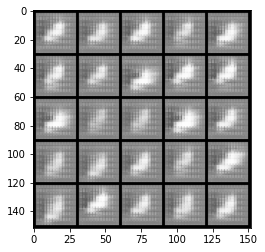

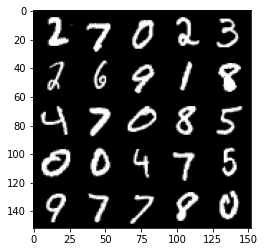

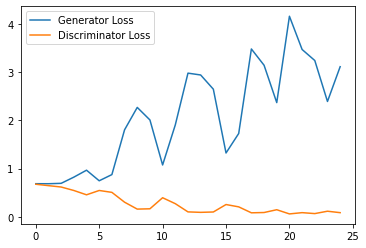

Step 1000: Generator loss: 4.472440548419953, discriminator loss: 0.06431584333255887


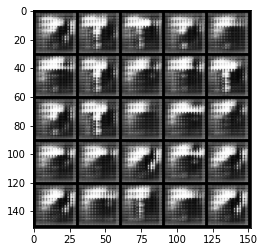

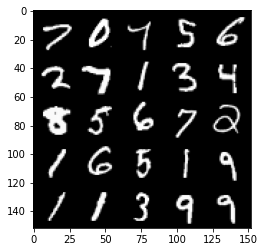

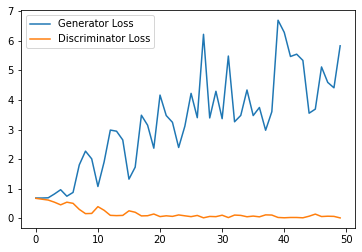

Step 1500: Generator loss: 4.252797962188721, discriminator loss: 0.064715964413248


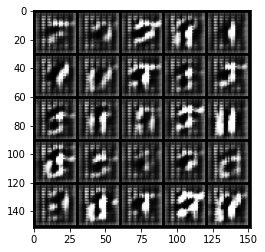

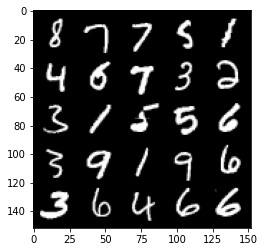

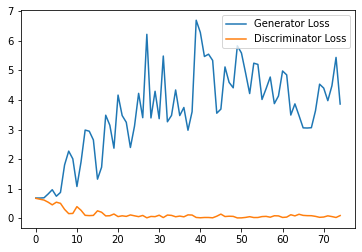

Step 2000: Generator loss: 3.2460029830932617, discriminator loss: 0.12356486364454031


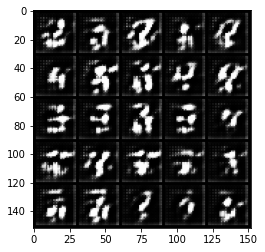

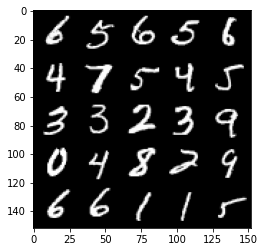

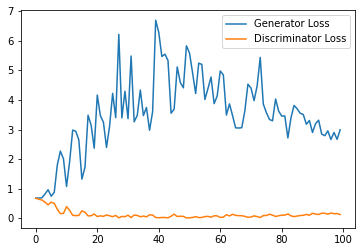

Step 2500: Generator loss: 2.723908227682114, discriminator loss: 0.20853359350562095


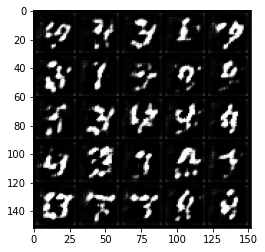

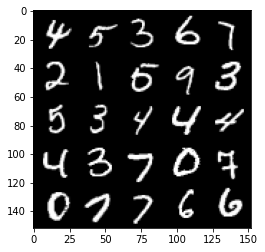

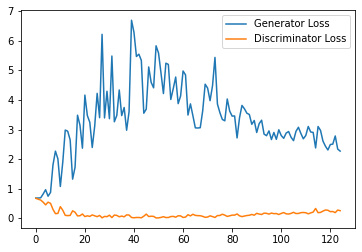

Step 3000: Generator loss: 2.249478357076645, discriminator loss: 0.298741895288229


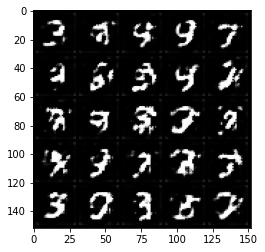

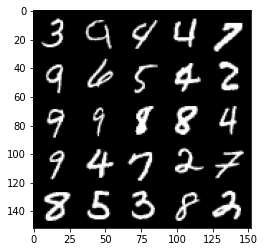

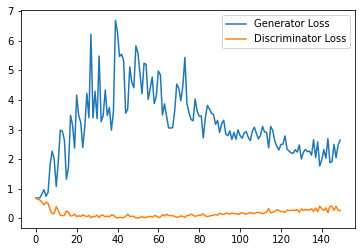

Step 3500: Generator loss: 2.225849473237991, discriminator loss: 0.34391043946146965


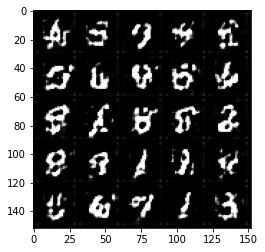

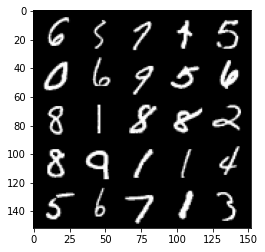

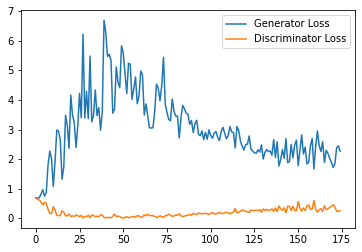

Step 4000: Generator loss: 1.9854979870319367, discriminator loss: 0.33483012196421624


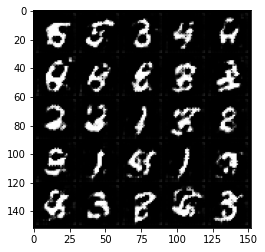

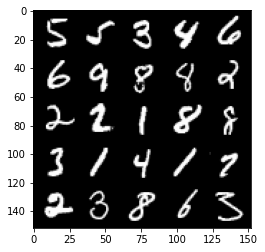

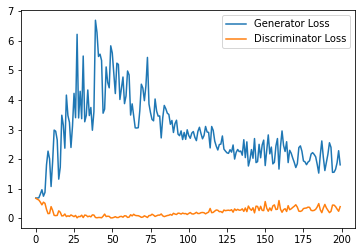

Step 4500: Generator loss: 2.0853867666721344, discriminator loss: 0.33891695708036423


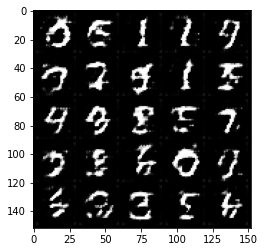

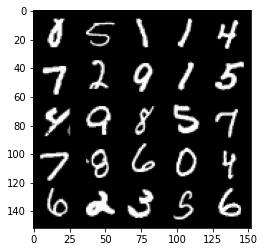

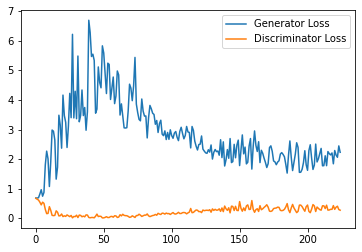

Step 5000: Generator loss: 1.8752107961177826, discriminator loss: 0.3557119654417038


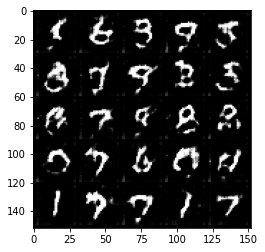

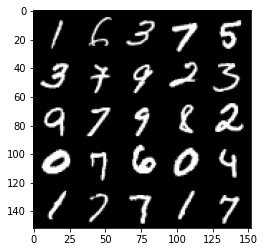

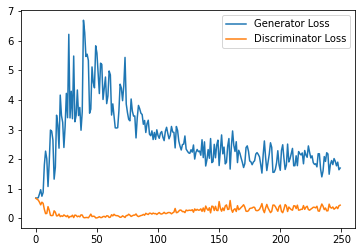

Step 5500: Generator loss: 1.7989174571037292, discriminator loss: 0.36512571692466733


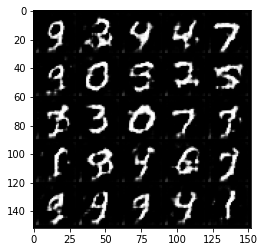

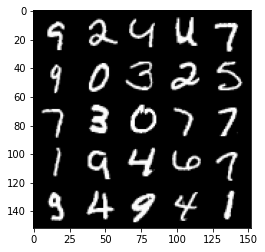

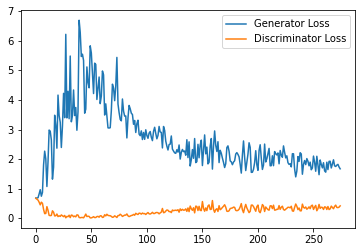

Step 6000: Generator loss: 1.7028624534606933, discriminator loss: 0.39618136116862296


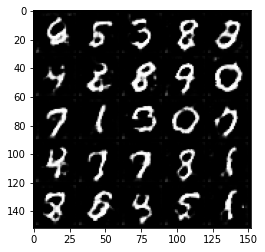

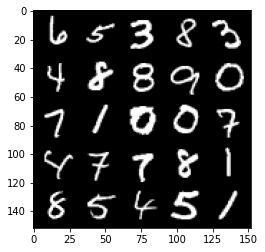

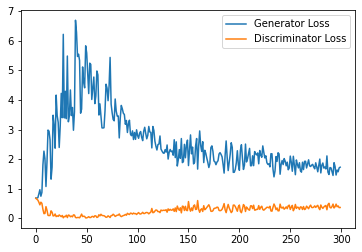

Step 6500: Generator loss: 1.5829882090091705, discriminator loss: 0.4514788528084755


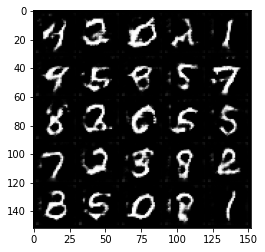

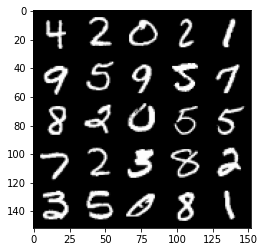

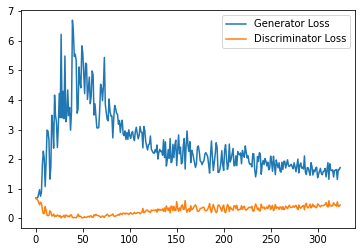

Step 7000: Generator loss: 1.5332701148986816, discriminator loss: 0.4650038294196129


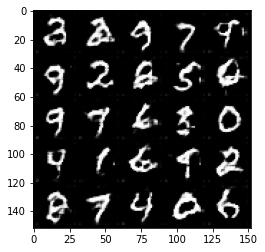

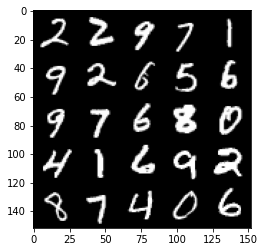

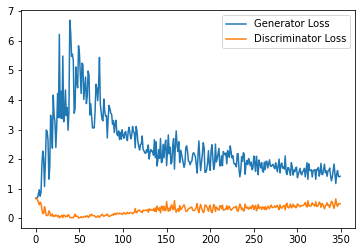

Step 7500: Generator loss: 1.3706634882688522, discriminator loss: 0.4818961599469185


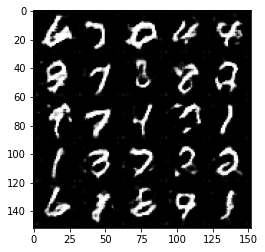

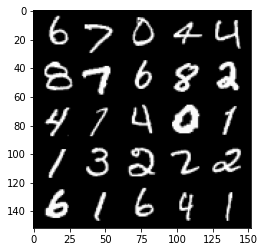

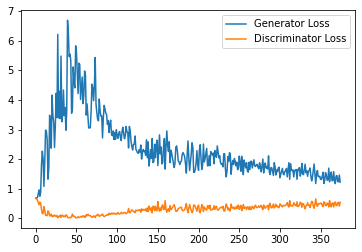

Step 8000: Generator loss: 1.423992859005928, discriminator loss: 0.48687414872646334


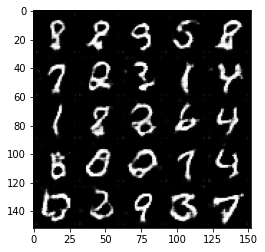

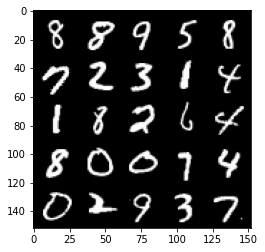

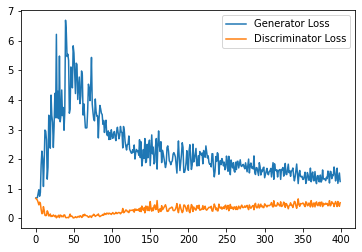

Step 8500: Generator loss: 1.3297404963970185, discriminator loss: 0.512981239259243


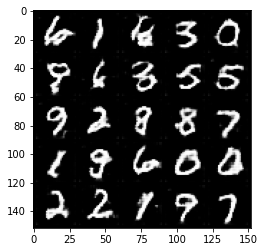

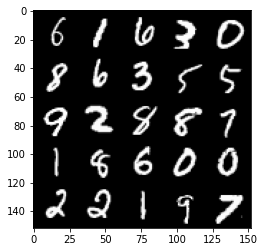

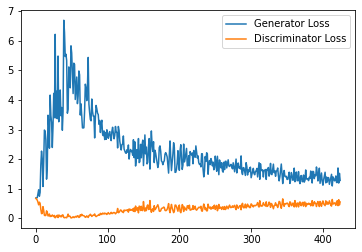

Step 9000: Generator loss: 1.281340589761734, discriminator loss: 0.5198354902863502


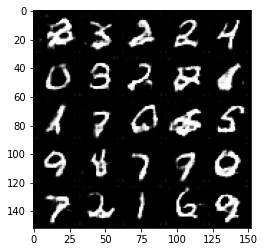

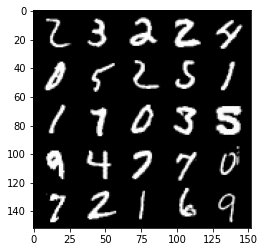

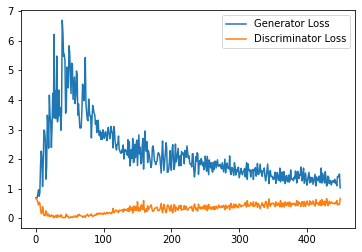

Step 9500: Generator loss: 1.2627139321565628, discriminator loss: 0.522771965622902


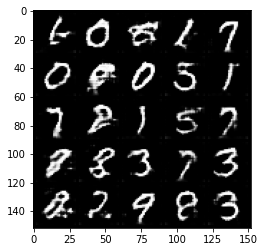

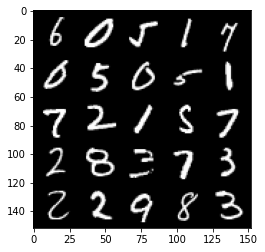

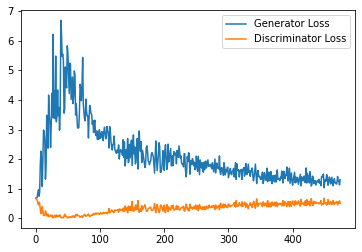

Step 10000: Generator loss: 1.2690717470645905, discriminator loss: 0.5354762793779373


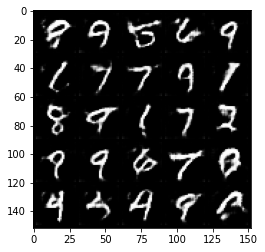

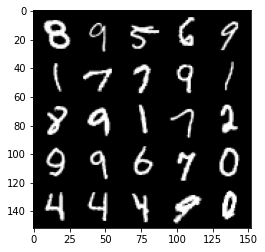

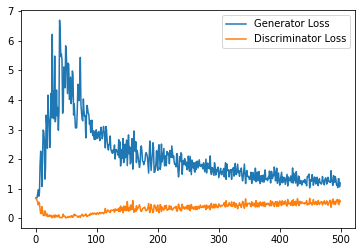

Step 14500: Generator loss: 1.0437983796596526, discriminator loss: 0.5805034509301186


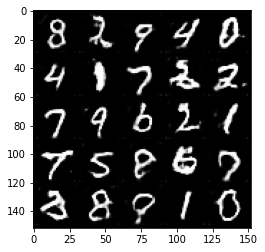

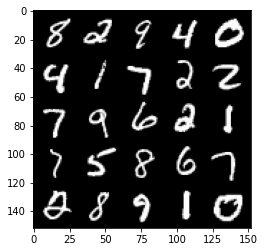

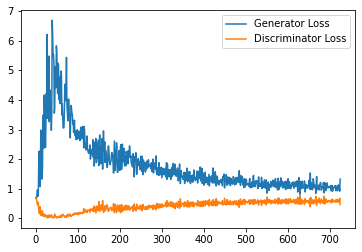

Step 15000: Generator loss: 1.0945956152677536, discriminator loss: 0.5838605788350105


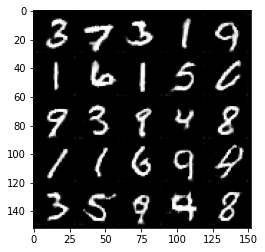

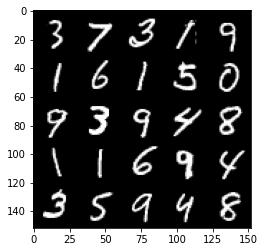

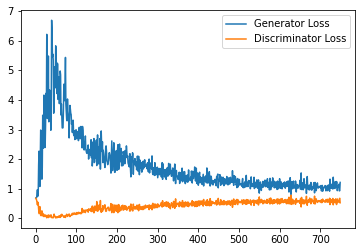

Step 15500: Generator loss: 1.0149469410181045, discriminator loss: 0.5950860657691955


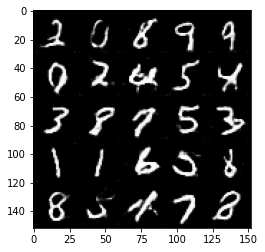

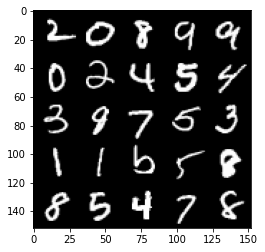

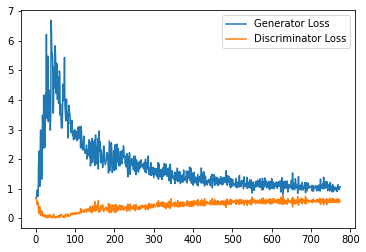

Step 16000: Generator loss: 1.0560837744474412, discriminator loss: 0.5979770990610123


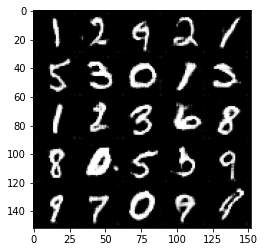

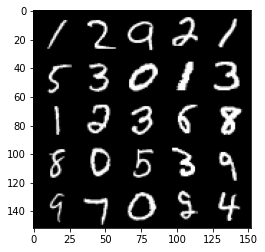

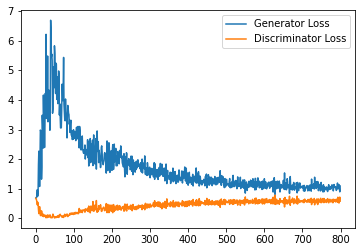

Step 16500: Generator loss: 1.028286921620369, discriminator loss: 0.5959291587471962


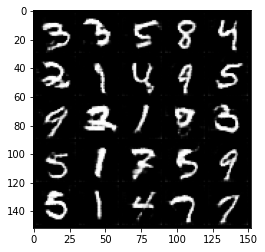

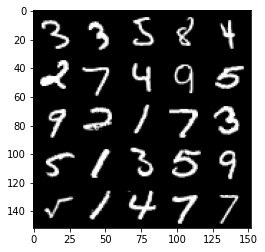

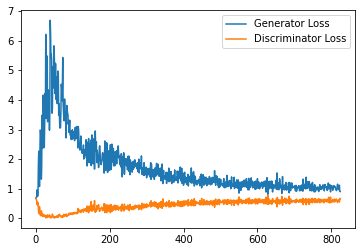

Step 17000: Generator loss: 1.0417299021482467, discriminator loss: 0.5826499050855637


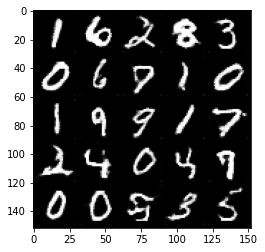

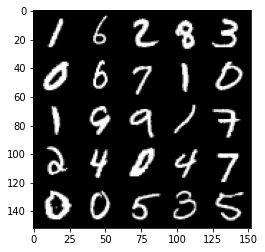

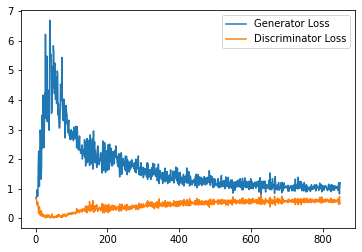

Step 17500: Generator loss: 1.02684046959877, discriminator loss: 0.5968727345466613


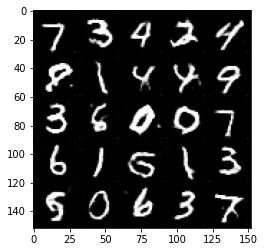

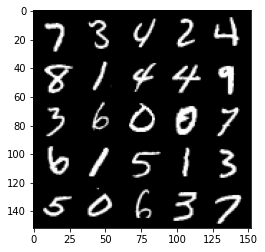

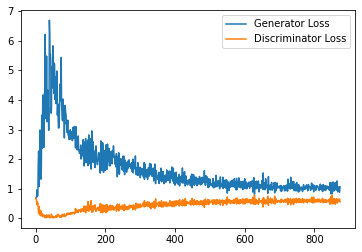

Step 18000: Generator loss: 1.0345786499977112, discriminator loss: 0.5931753890514374


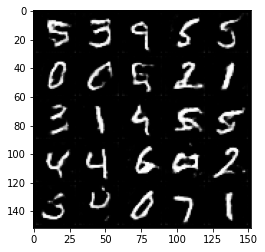

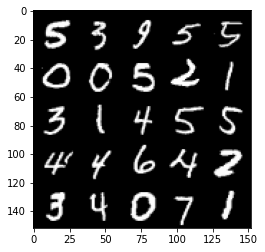

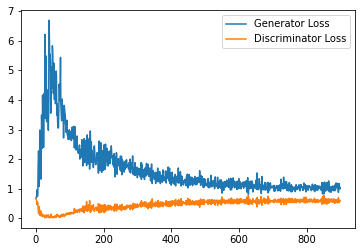

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Step 28000: Generator loss: 0.9748942462205887, discriminator loss: 0.6075736077427865


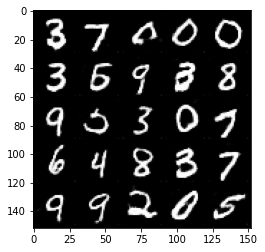

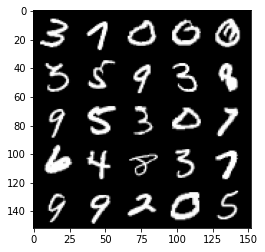

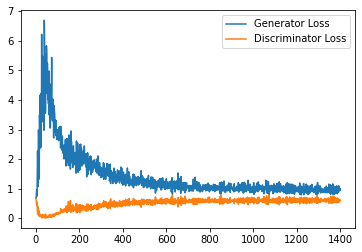

Step 28500: Generator loss: 0.9863833723068237, discriminator loss: 0.602174605846405


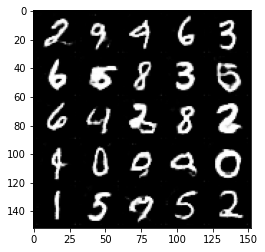

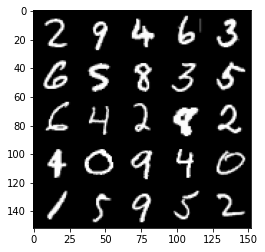

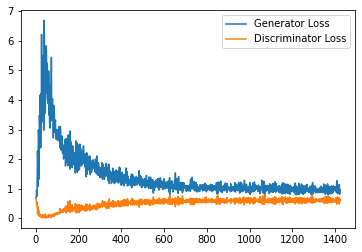

Step 29000: Generator loss: 0.9482185493707657, discriminator loss: 0.6067367029190064


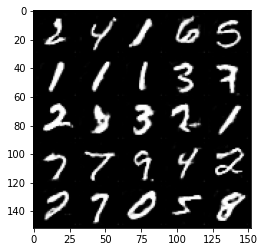

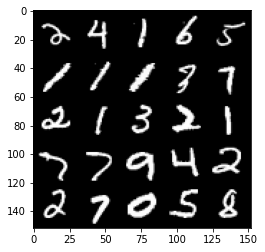

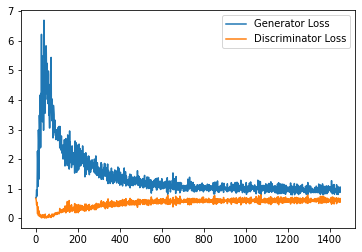

Step 29500: Generator loss: 0.9700422878265381, discriminator loss: 0.5988506265878677


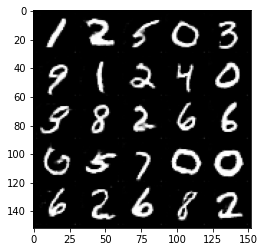

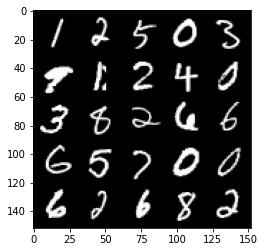

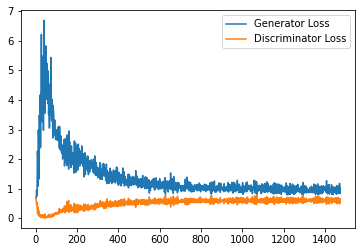

Step 30000: Generator loss: 0.9691090586185456, discriminator loss: 0.6061738068461419


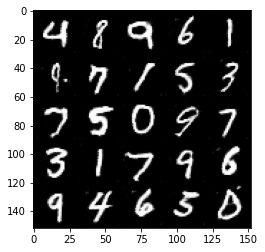

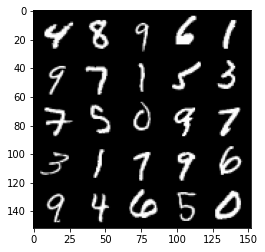

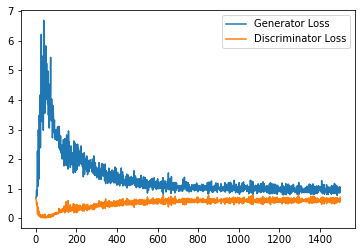

Step 30500: Generator loss: 0.9839830557107926, discriminator loss: 0.5990583220720291


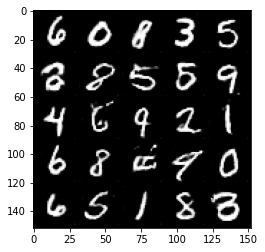

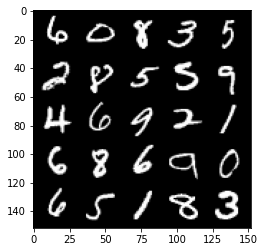

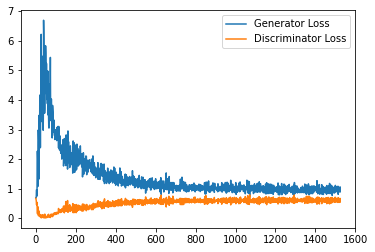

Step 31000: Generator loss: 0.9873062564134598, discriminator loss: 0.5993348970413208


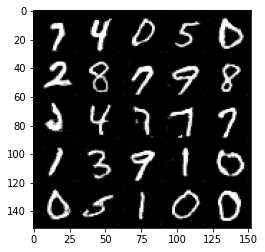

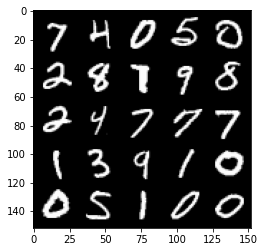

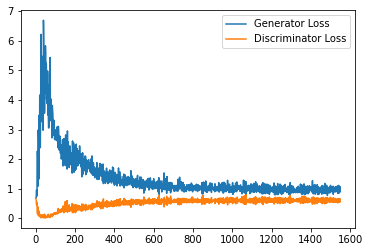

Step 31500: Generator loss: 0.9897526938915253, discriminator loss: 0.5998749188780784


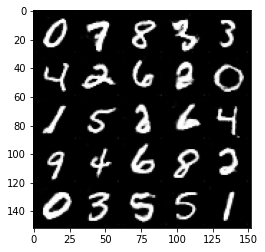

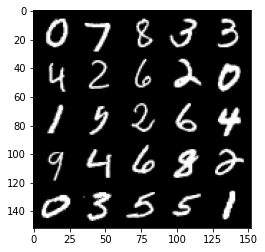

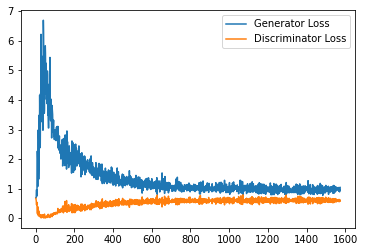

Step 32000: Generator loss: 0.9740615742206573, discriminator loss: 0.5987609582543373


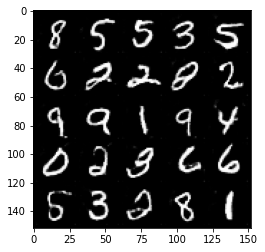

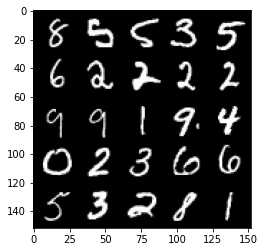

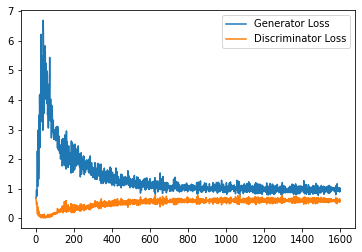

Step 32500: Generator loss: 0.9902068911790848, discriminator loss: 0.5993841580152511


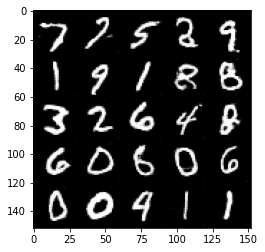

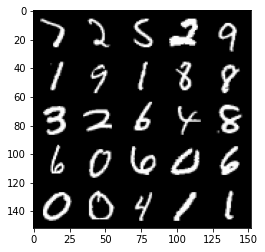

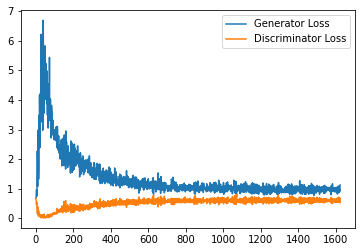

Step 33000: Generator loss: 1.014920581459999, discriminator loss: 0.6030068752765656


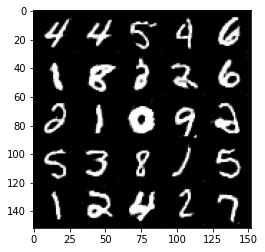

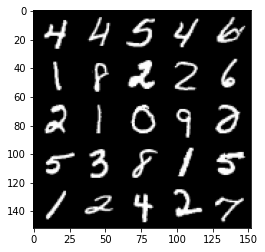

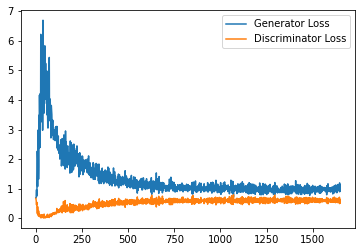

Step 33500: Generator loss: 0.993253402709961, discriminator loss: 0.6058019419908524


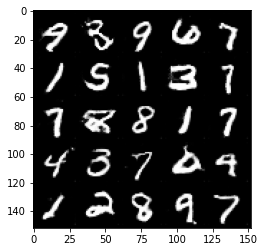

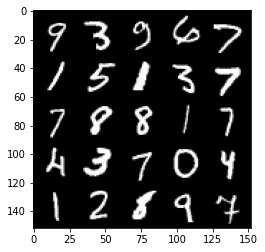

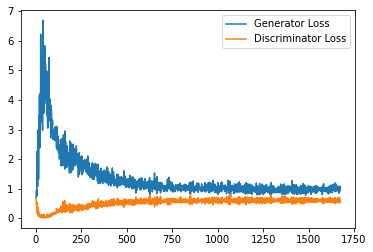

Step 34000: Generator loss: 0.9694427205324173, discriminator loss: 0.598502810895443


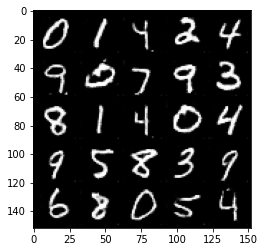

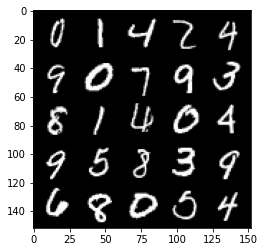

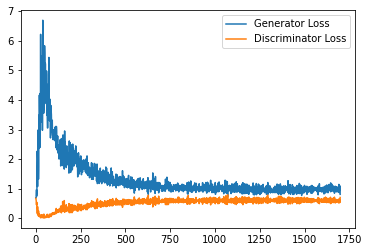

Step 38000: Generator loss: 1.0259471875429154, discriminator loss: 0.5926518346071243


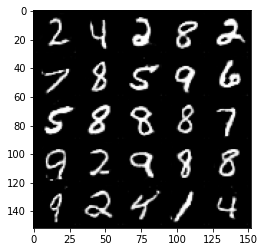

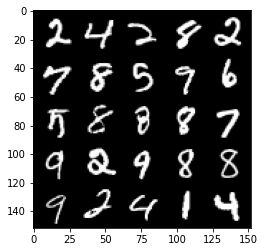

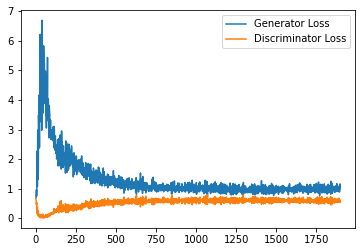

Step 38500: Generator loss: 0.9847091609239578, discriminator loss: 0.594510078072548


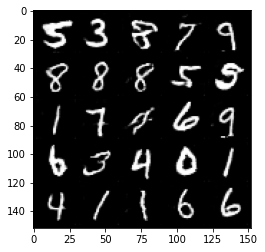

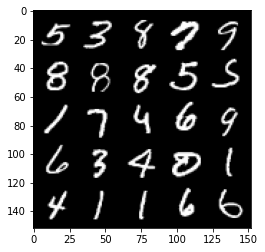

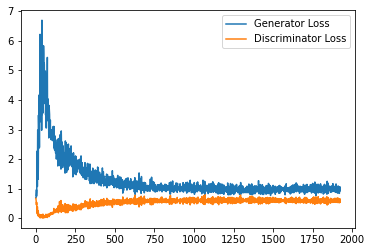

Step 39000: Generator loss: 0.9914520579576492, discriminator loss: 0.5909038450717926


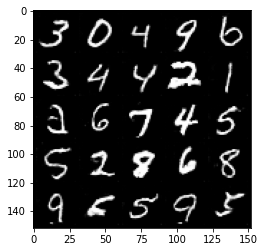

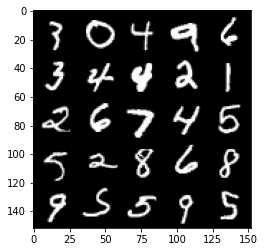

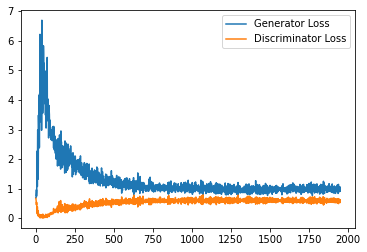

Step 39500: Generator loss: 1.0185404235124589, discriminator loss: 0.5872516859769821


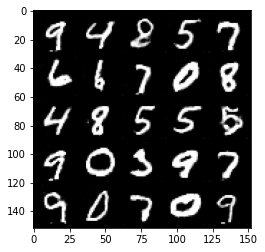

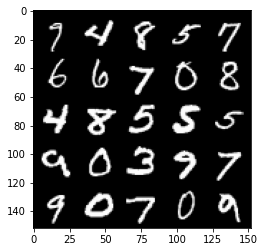

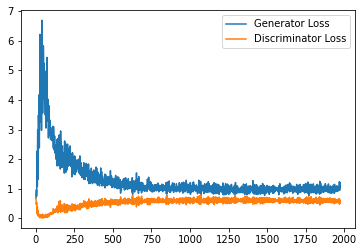

Step 40000: Generator loss: 1.0097196301221847, discriminator loss: 0.5987624586820602


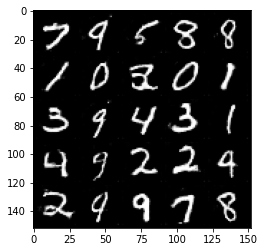

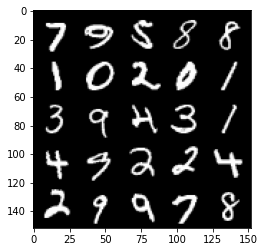

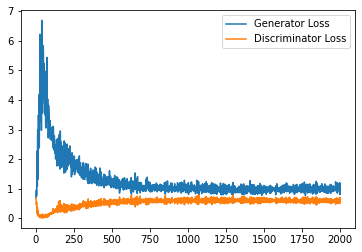

Step 40500: Generator loss: 0.9783654289245606, discriminator loss: 0.5875270213484765


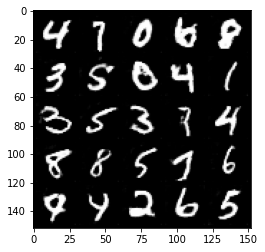

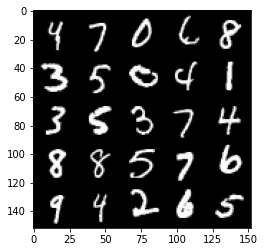

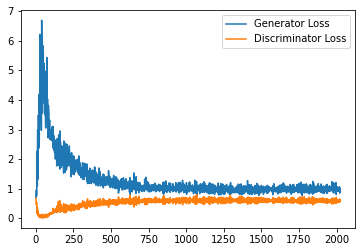

Step 41000: Generator loss: 0.9862761843204498, discriminator loss: 0.5851906287670136


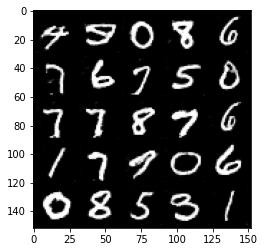

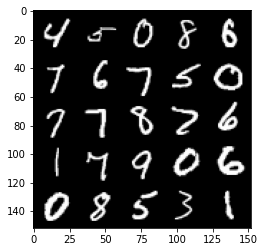

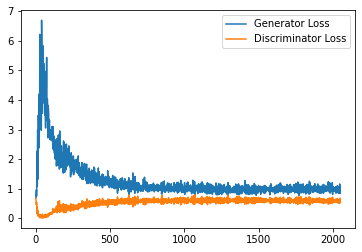

Step 41500: Generator loss: 1.0290186903476715, discriminator loss: 0.5990972553491593


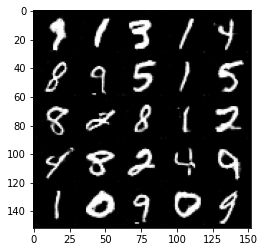

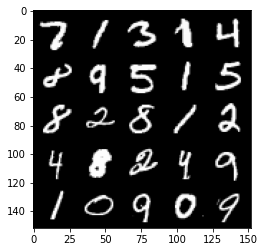

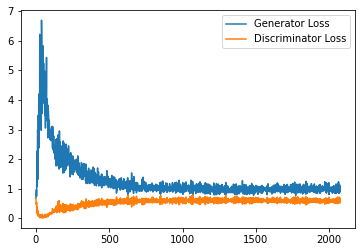

Step 42000: Generator loss: 1.0226267315149307, discriminator loss: 0.5837726252675056


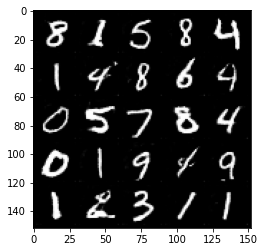

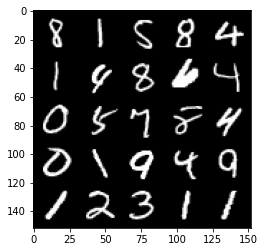

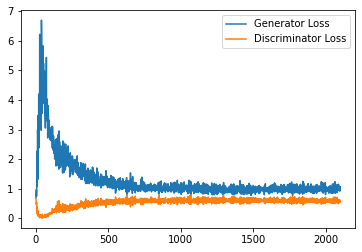

Step 42500: Generator loss: 0.9888183500766754, discriminator loss: 0.5924848615527153


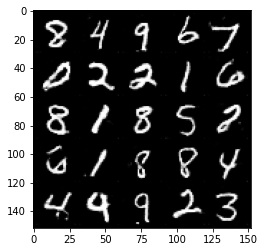

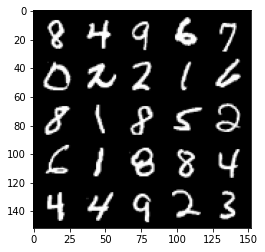

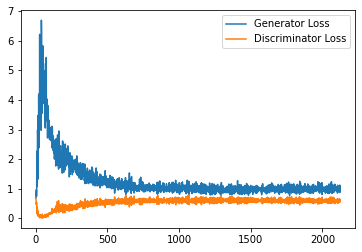

Step 43000: Generator loss: 1.0118110768795014, discriminator loss: 0.5863612467646598


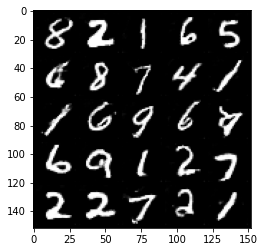

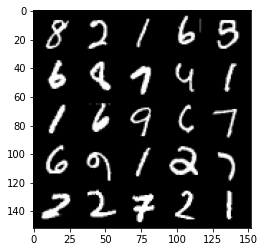

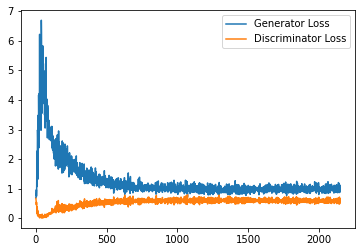

Step 43500: Generator loss: 1.0427390234470368, discriminator loss: 0.5795567857027054


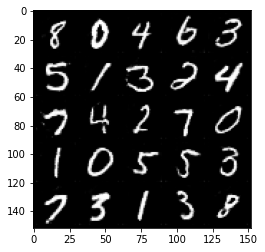

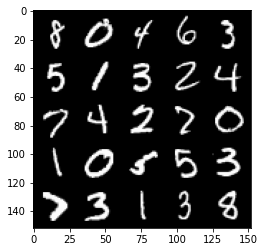

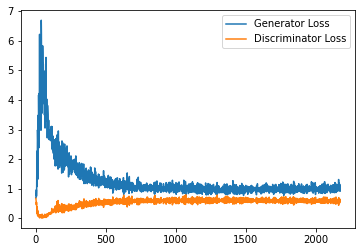

Step 44000: Generator loss: 1.0378695882558822, discriminator loss: 0.583623548924923


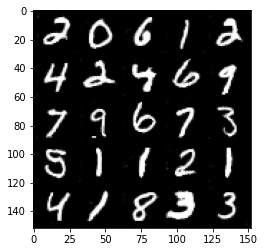

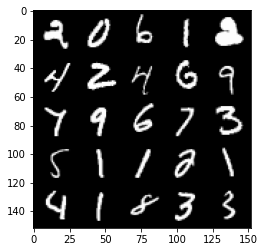

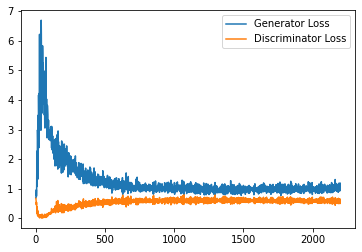

Step 44500: Generator loss: 1.0092646570205688, discriminator loss: 0.5855583104491234


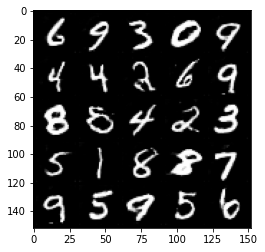

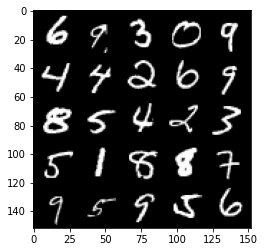

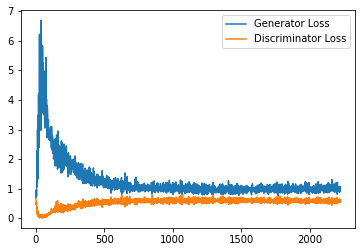

Step 45000: Generator loss: 1.0298438061475754, discriminator loss: 0.5856868135929107


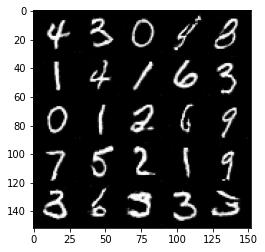

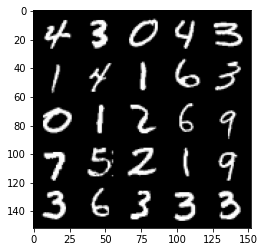

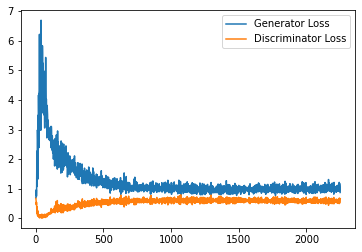

Step 45500: Generator loss: 1.025834023475647, discriminator loss: 0.5793959187269211


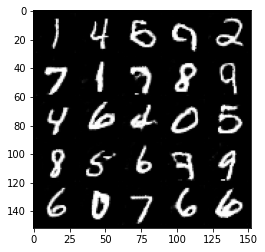

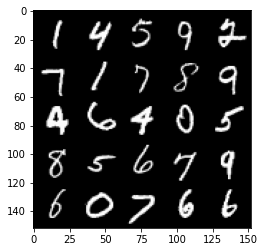

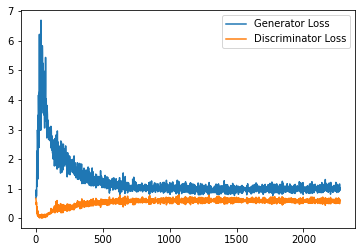

Step 46000: Generator loss: 1.0274245373010635, discriminator loss: 0.5776092674732208


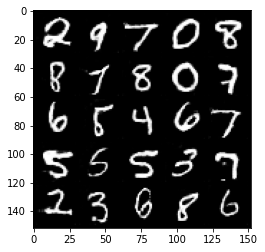

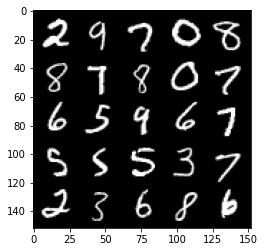

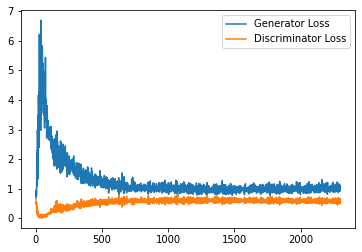

Step 46500: Generator loss: 1.0221181520223617, discriminator loss: 0.5765261922478676


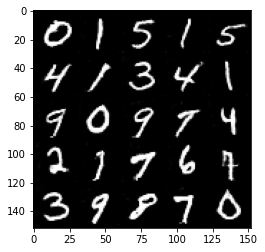

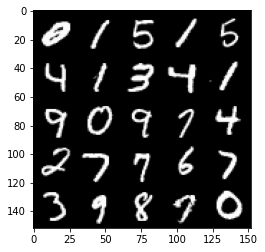

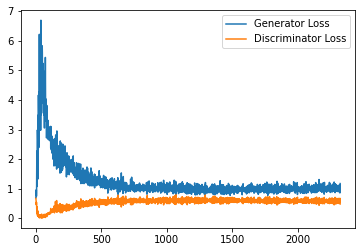

Step 47000: Generator loss: 1.0213288449048996, discriminator loss: 0.5843434523940086


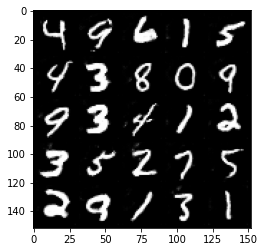

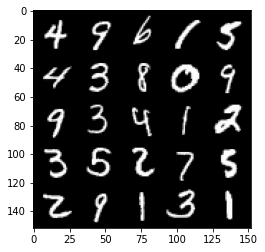

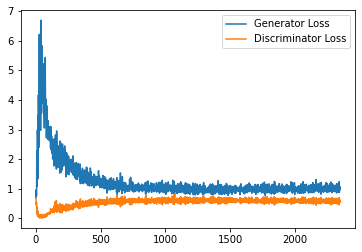

Step 47500: Generator loss: 1.039650738954544, discriminator loss: 0.5764421883225441


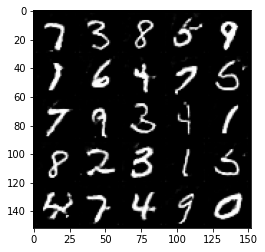

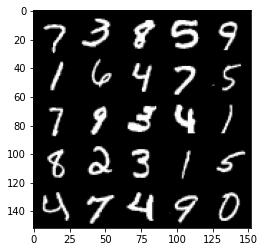

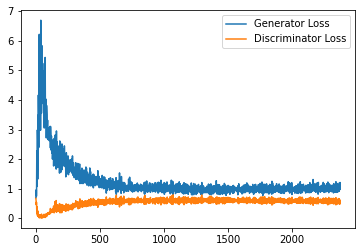

Step 48000: Generator loss: 1.0340387006998062, discriminator loss: 0.5772481760382653


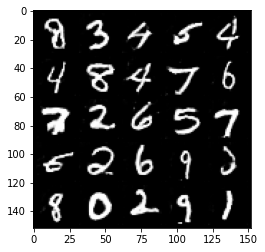

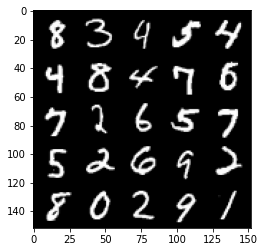

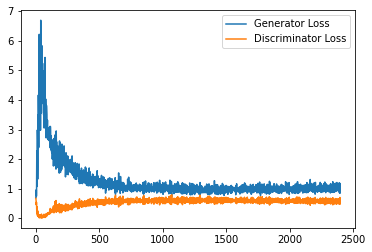

Step 48500: Generator loss: 1.0164741483926774, discriminator loss: 0.580378340780735


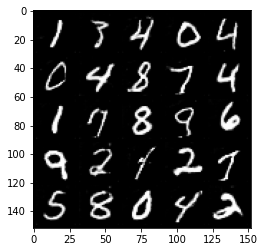

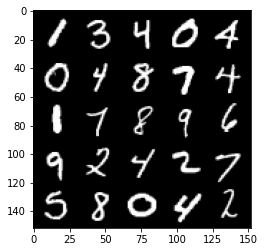

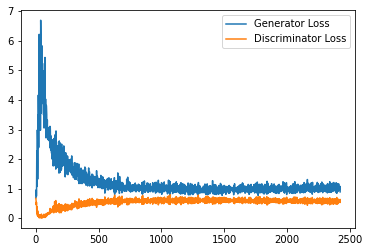

Step 49000: Generator loss: 1.0236555378437042, discriminator loss: 0.5762112011909485


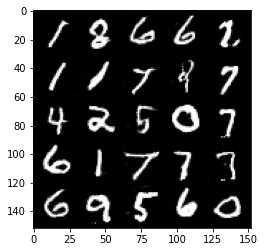

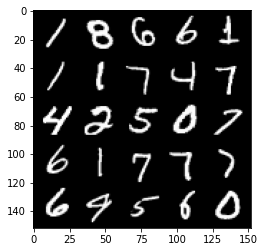

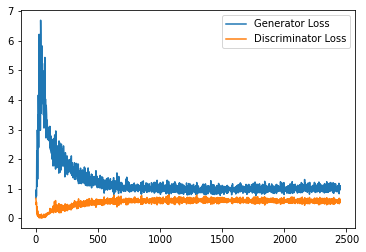

Step 49500: Generator loss: 1.0519714243412017, discriminator loss: 0.5769502675533295


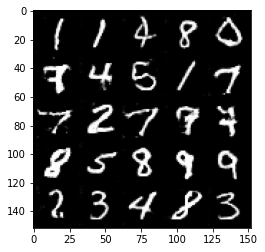

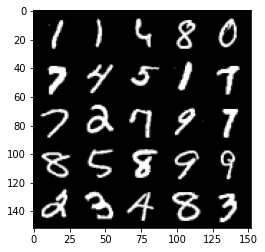

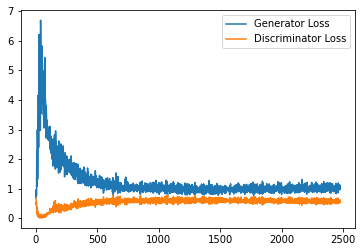

Step 50000: Generator loss: 1.0383984221220017, discriminator loss: 0.5831558148860931


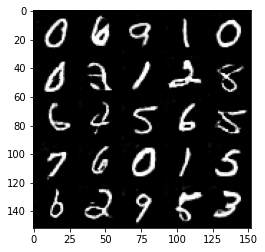

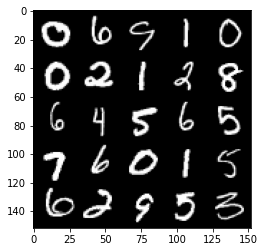

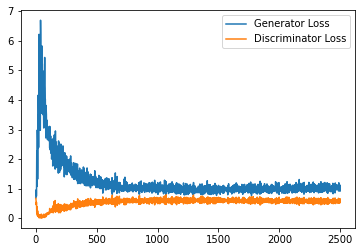

Step 50500: Generator loss: 1.0313128788471222, discriminator loss: 0.5758556090593338


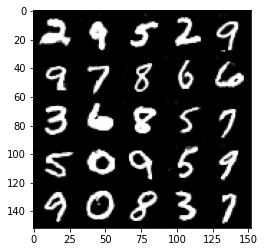

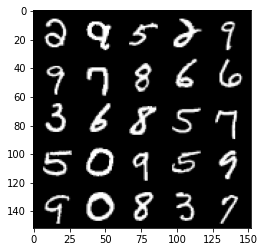

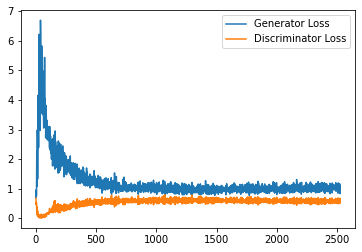

Step 51000: Generator loss: 1.04278280878067, discriminator loss: 0.5785318760871887


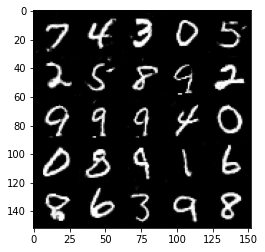

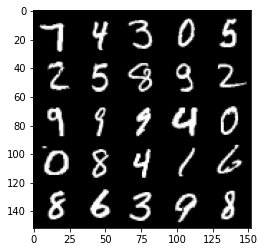

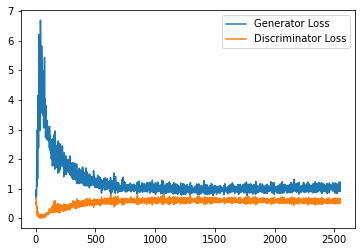

Step 51500: Generator loss: 1.0673352766036988, discriminator loss: 0.5737893103957176


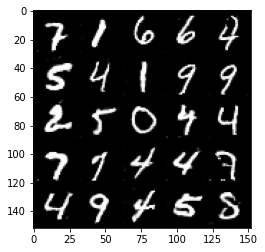

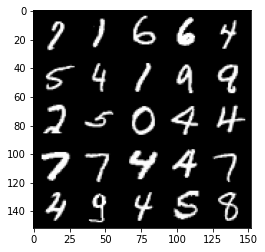

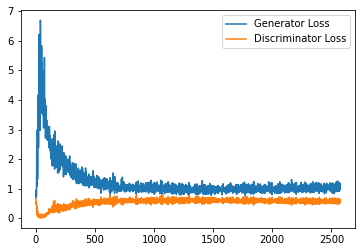

Step 52000: Generator loss: 1.0465953898429872, discriminator loss: 0.5726252607703209


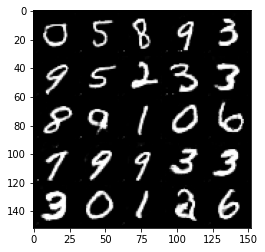

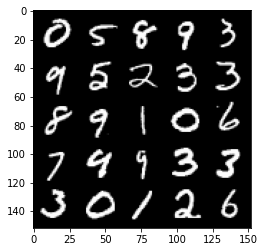

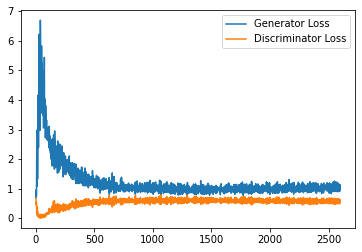

Step 52500: Generator loss: 1.0509022605419158, discriminator loss: 0.5760001487731934


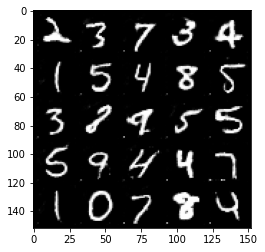

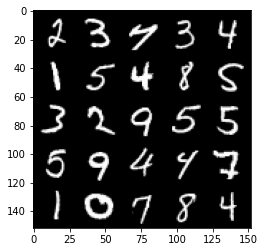

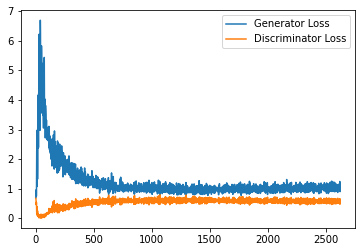

Step 53000: Generator loss: 1.0523167308568955, discriminator loss: 0.5726501634716987


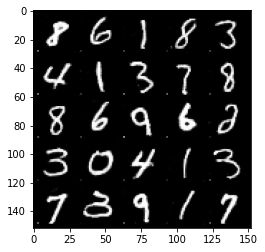

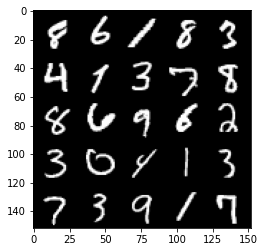

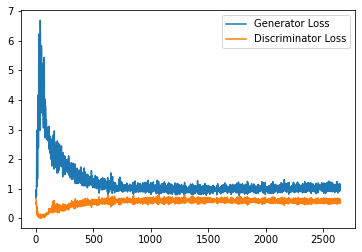

Step 53500: Generator loss: 1.058437183022499, discriminator loss: 0.5826005845069885


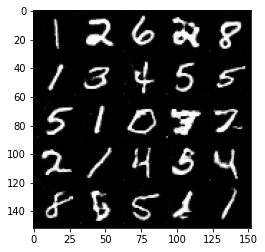

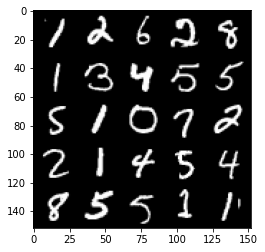

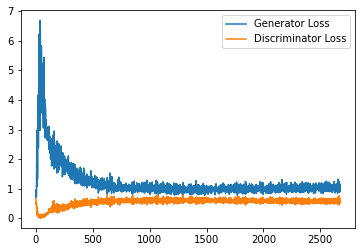

Step 54000: Generator loss: 1.0604262531995774, discriminator loss: 0.5704918954372405


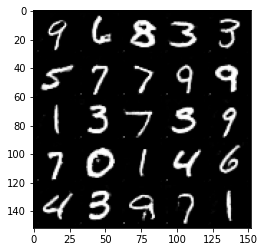

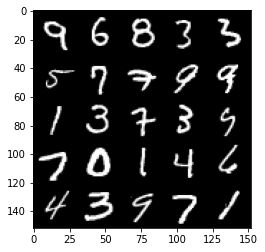

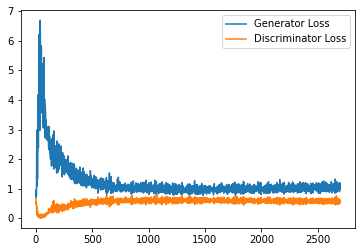

Step 54500: Generator loss: 1.0405144227743148, discriminator loss: 0.5768795932531356


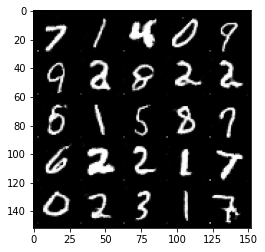

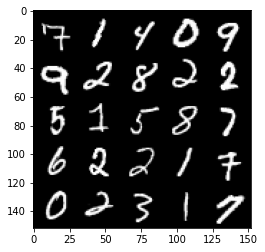

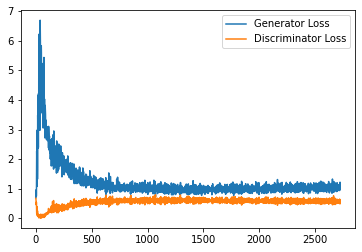

Step 55000: Generator loss: 1.0637996909618377, discriminator loss: 0.5827304534912109


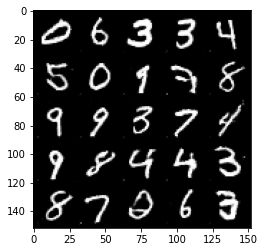

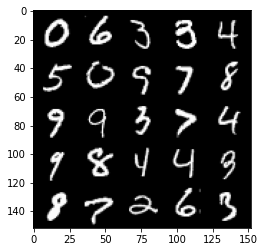

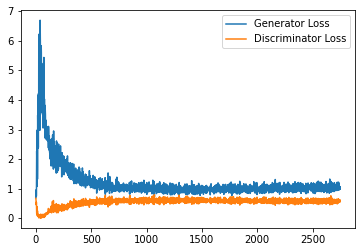

Step 55500: Generator loss: 1.0543065336942672, discriminator loss: 0.5827479639649391


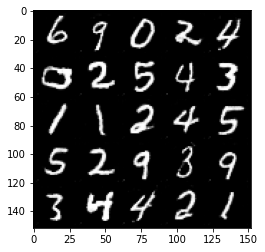

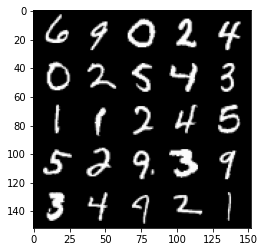

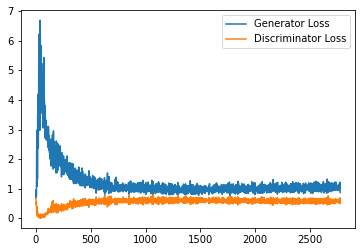

Step 56000: Generator loss: 1.063962103843689, discriminator loss: 0.57748814868927


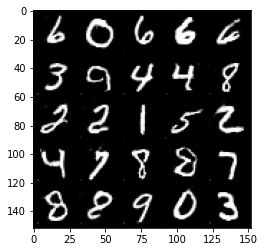

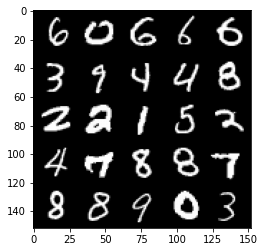

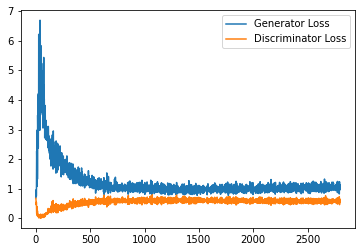

Step 56500: Generator loss: 1.040798877596855, discriminator loss: 0.5736500281691551


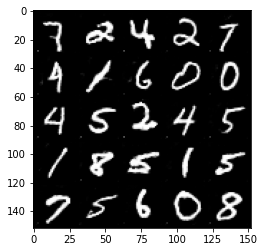

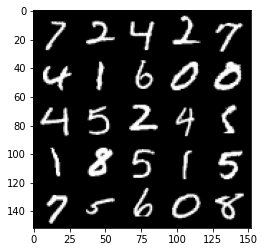

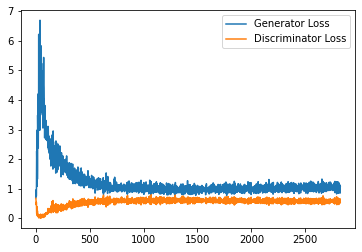

Step 57000: Generator loss: 1.0406013959646225, discriminator loss: 0.5755037745833397


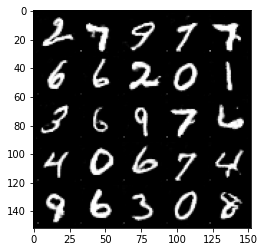

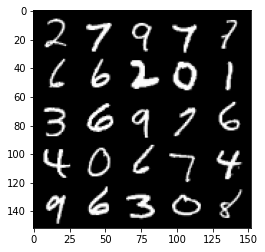

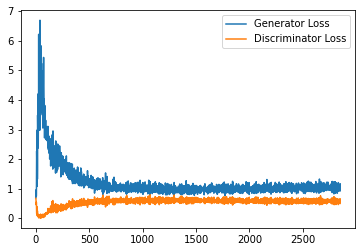

Step 57500: Generator loss: 1.0396863269805907, discriminator loss: 0.5742927253842354


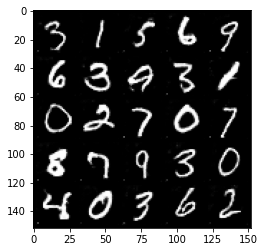

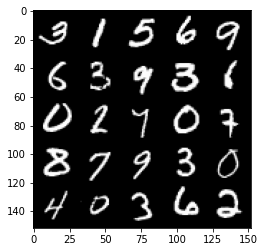

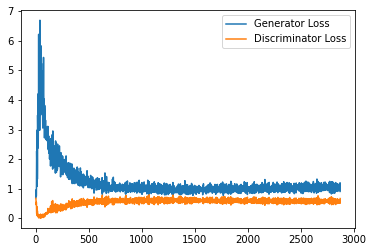

Step 58000: Generator loss: 1.077093098640442, discriminator loss: 0.5712660750150681


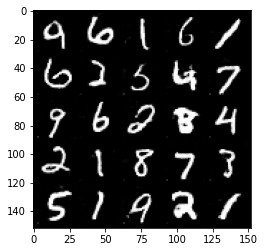

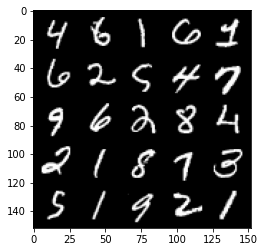

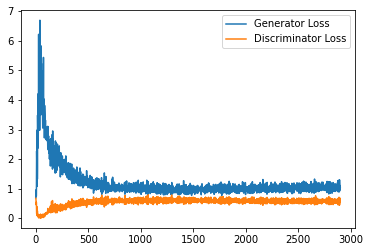

Step 58500: Generator loss: 1.0343726006746292, discriminator loss: 0.5800452873706817


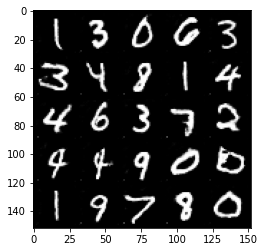

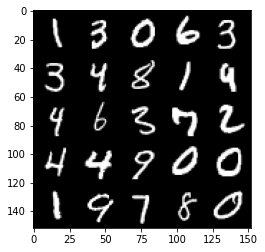

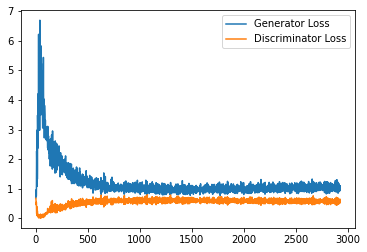

Step 59000: Generator loss: 1.0535858570337295, discriminator loss: 0.5693099581599236


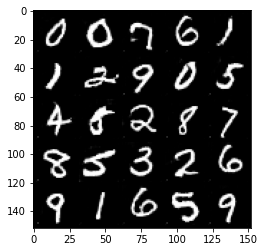

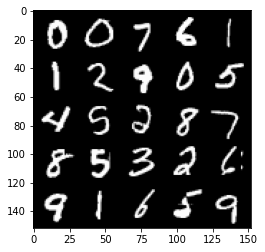

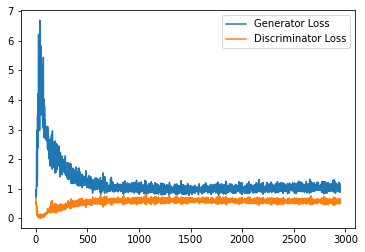

Step 59500: Generator loss: 1.0421187222003936, discriminator loss: 0.5795690695047379


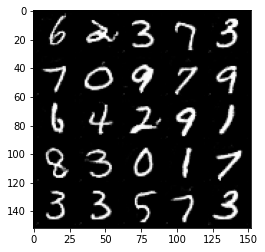

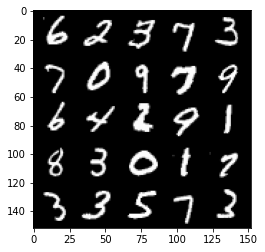

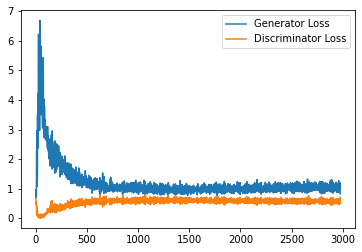

Step 60000: Generator loss: 1.063800562977791, discriminator loss: 0.5726089991927147


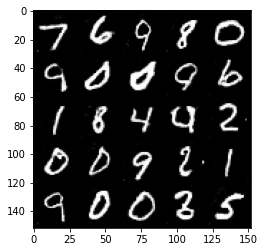

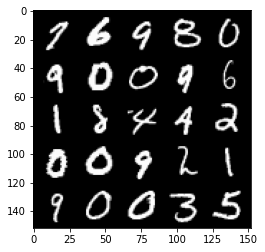

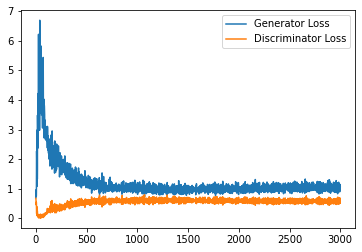

Step 60500: Generator loss: 1.0678531782627105, discriminator loss: 0.5733614264726639


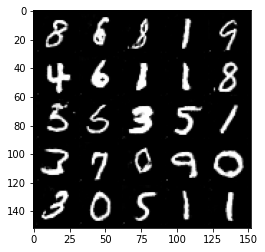

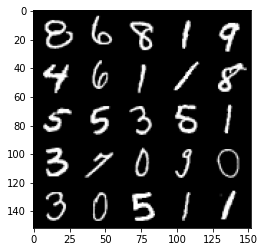

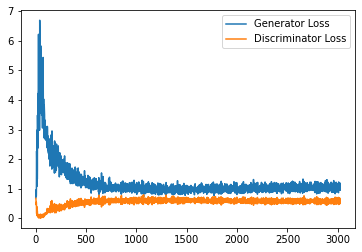

Step 61000: Generator loss: 1.0584985802173614, discriminator loss: 0.5798807988762855


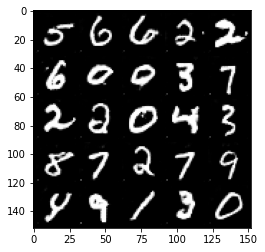

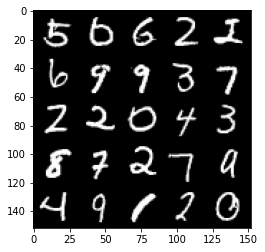

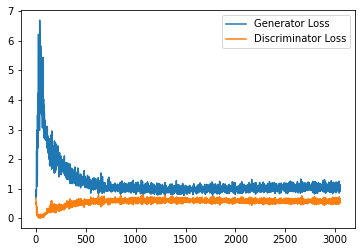

Step 61500: Generator loss: 1.054648107290268, discriminator loss: 0.575115170121193


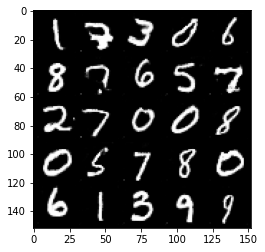

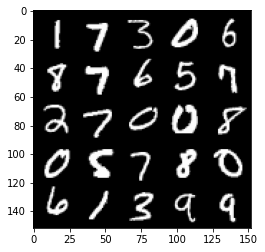

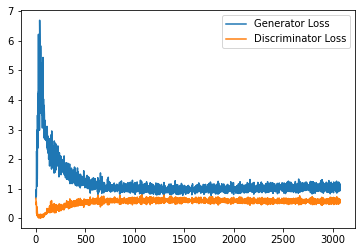

Step 62000: Generator loss: 1.043963486790657, discriminator loss: 0.5793173632621765


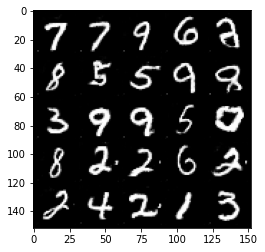

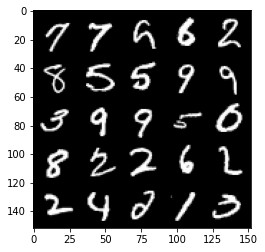

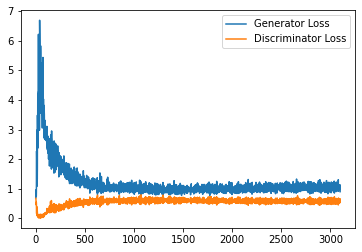

Step 62500: Generator loss: 1.0570085699558258, discriminator loss: 0.570127414226532


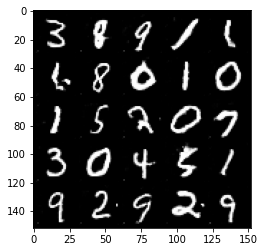

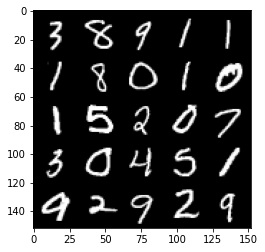

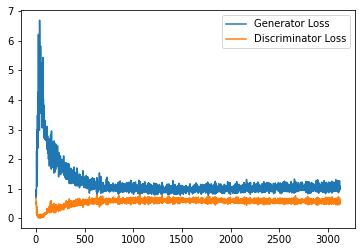

Step 63000: Generator loss: 1.0450652288198472, discriminator loss: 0.5786221037507058


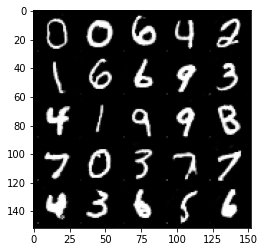

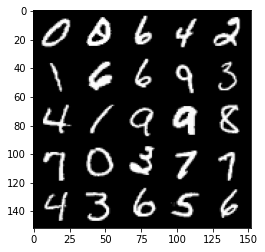

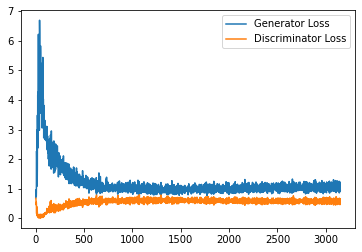

Step 63500: Generator loss: 1.050810482621193, discriminator loss: 0.5763881550431251


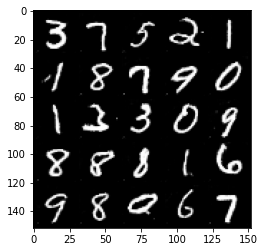

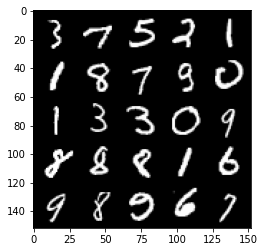

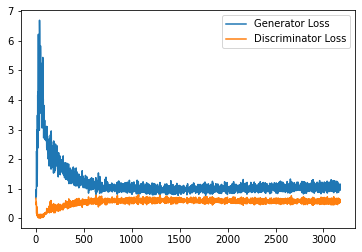

Step 64000: Generator loss: 1.0687276359796525, discriminator loss: 0.5705658013820648


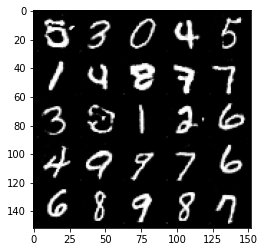

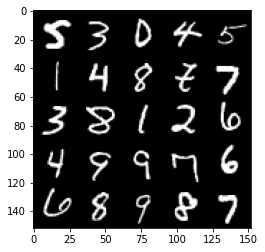

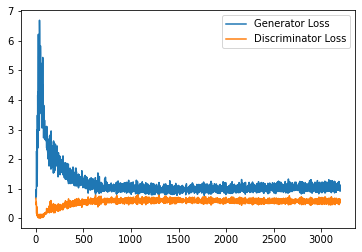

Step 64500: Generator loss: 1.0710441905260086, discriminator loss: 0.5768854758739471


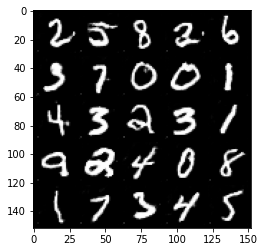

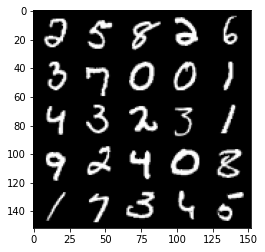

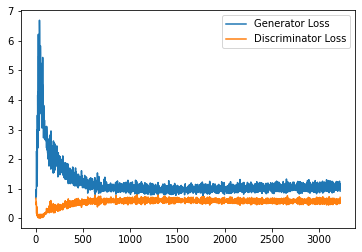

Step 65000: Generator loss: 1.049638799905777, discriminator loss: 0.5783552938103675


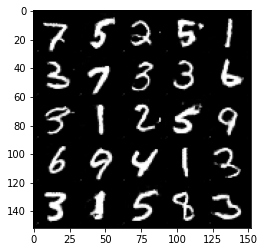

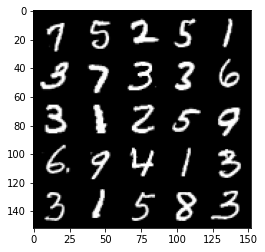

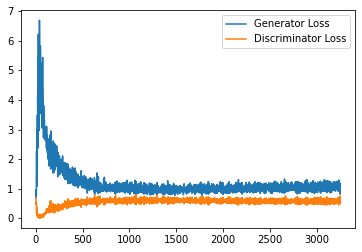

Step 65500: Generator loss: 1.0466062047481537, discriminator loss: 0.5792605475187301


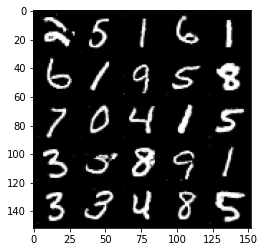

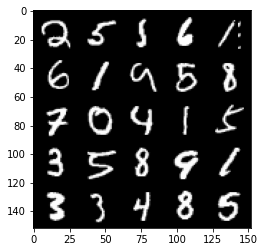

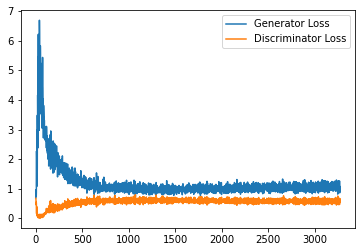

Step 66000: Generator loss: 1.049300914287567, discriminator loss: 0.5730643233656884


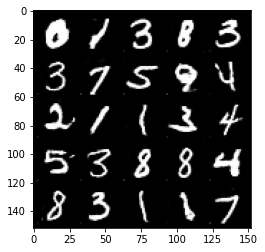

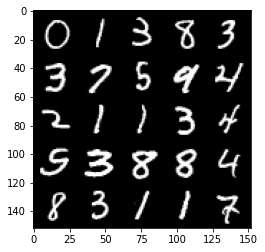

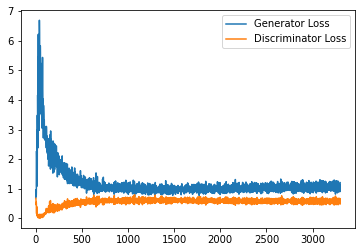

Step 66500: Generator loss: 1.0529282430410385, discriminator loss: 0.5778607063293457


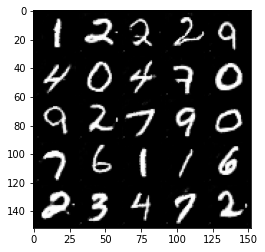

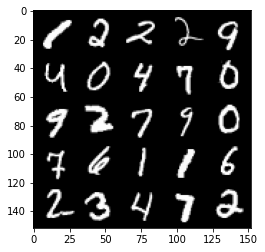

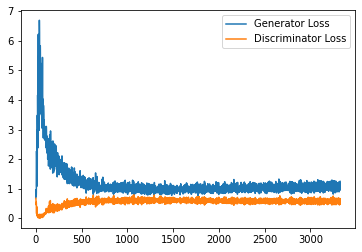

Step 67000: Generator loss: 1.0534316611289978, discriminator loss: 0.5748230699300766


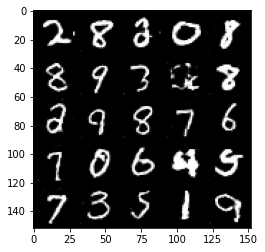

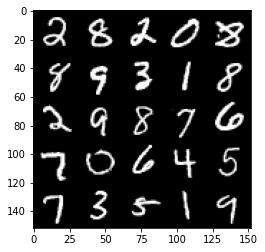

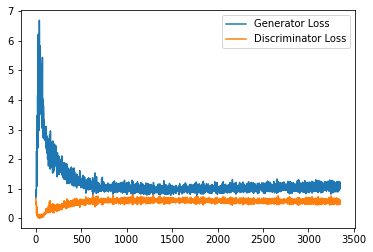

Step 67500: Generator loss: 1.0620925924777984, discriminator loss: 0.5726014719605446


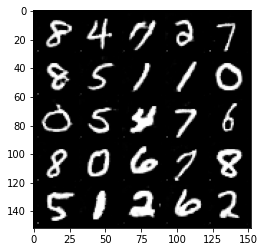

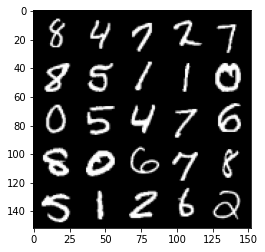

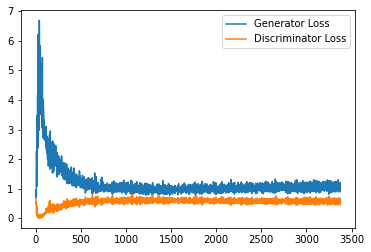

Step 78500: Generator loss: 1.0344942065477372, discriminator loss: 0.5829759428501129


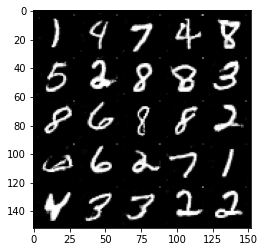

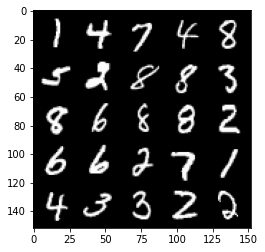

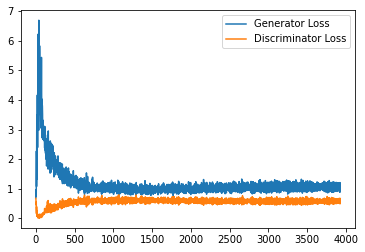

Step 79000: Generator loss: 1.0600914661884309, discriminator loss: 0.5778281685709953


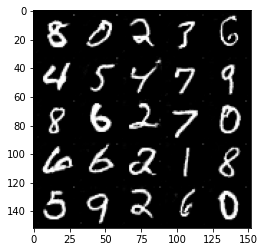

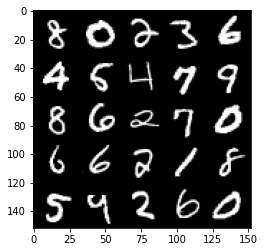

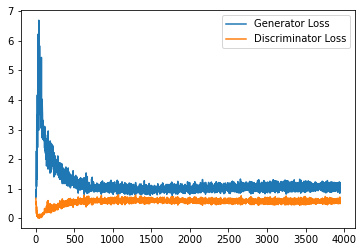

Step 79500: Generator loss: 1.0700727316141128, discriminator loss: 0.5787604428529739


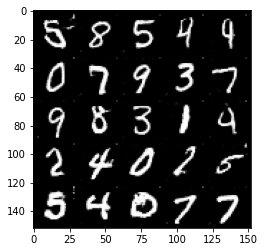

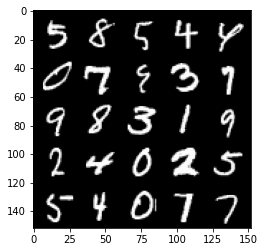

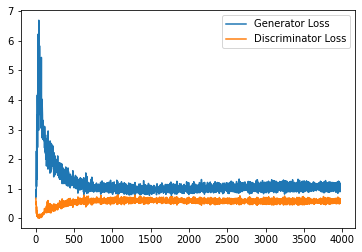

Step 80000: Generator loss: 1.0634399900436402, discriminator loss: 0.582149130821228


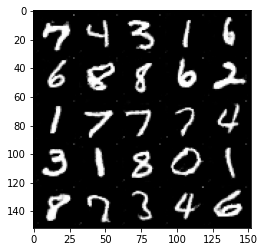

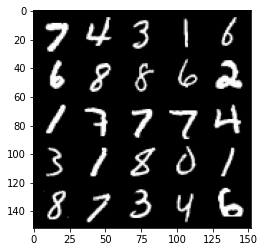

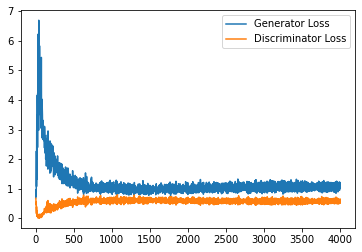

Step 80500: Generator loss: 1.0753982683420182, discriminator loss: 0.5751820254921913


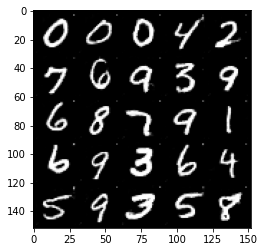

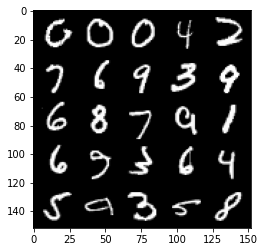

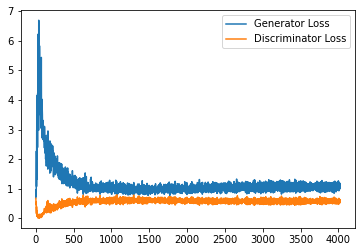

Step 81000: Generator loss: 1.0685876327753068, discriminator loss: 0.5797731704115867


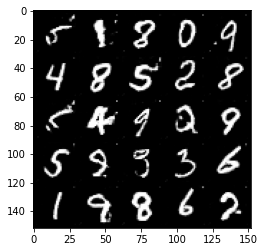

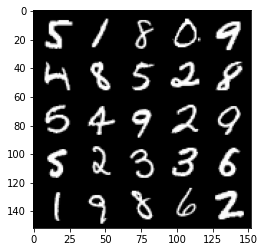

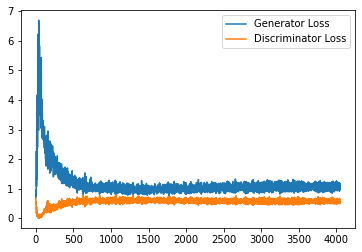

Step 81500: Generator loss: 1.057118670463562, discriminator loss: 0.5803459306359291


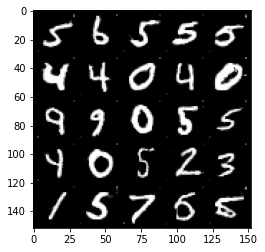

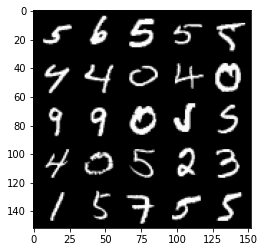

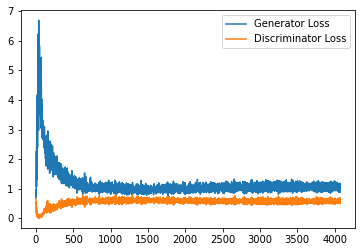

Step 82000: Generator loss: 1.0560828684568404, discriminator loss: 0.5829341703057289


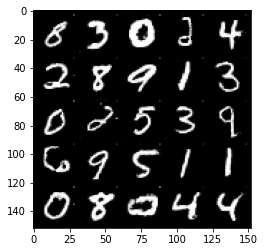

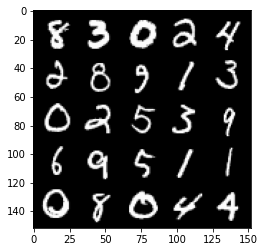

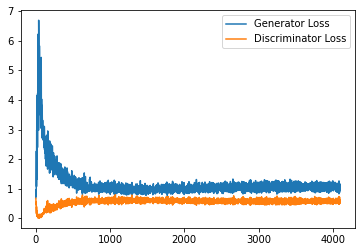

Step 82500: Generator loss: 1.04797419321537, discriminator loss: 0.5832323132157325


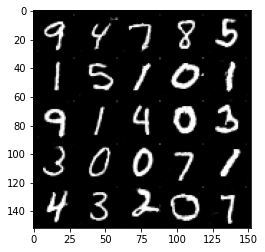

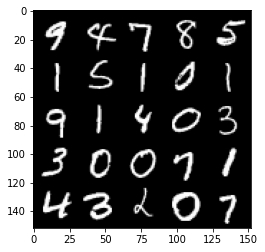

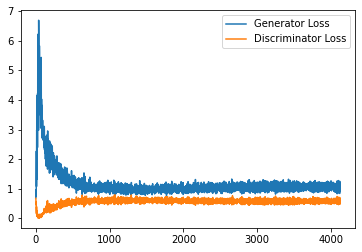

Step 83000: Generator loss: 1.0374480074644088, discriminator loss: 0.5856375179290771


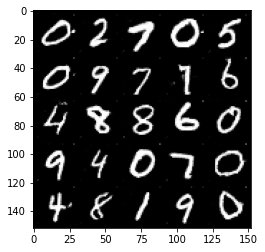

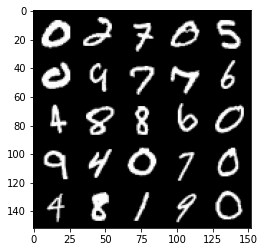

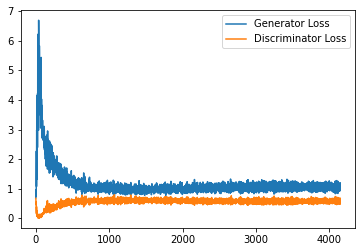

Step 83500: Generator loss: 1.055709043622017, discriminator loss: 0.5817699310779572


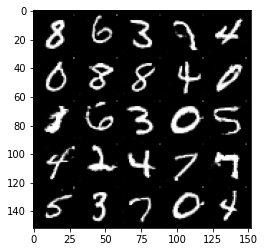

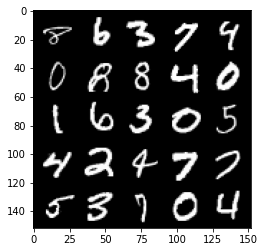

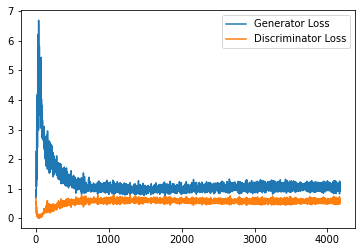

Step 84000: Generator loss: 1.0619085129499435, discriminator loss: 0.5797207868695259


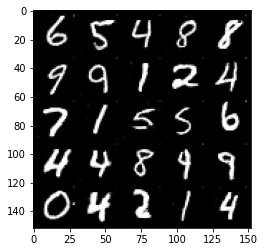

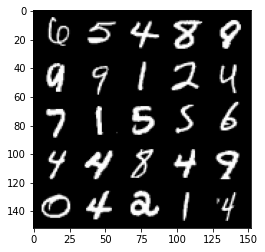

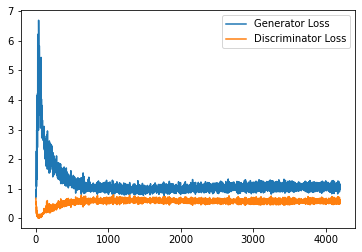

Step 84500: Generator loss: 1.050867453932762, discriminator loss: 0.5818901175260544


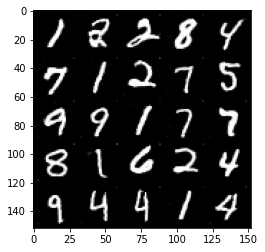

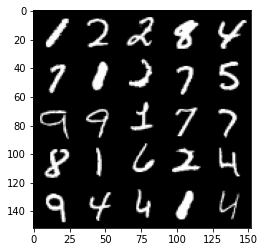

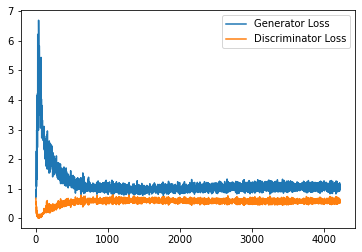

Step 85000: Generator loss: 1.0455278853178025, discriminator loss: 0.5776945139765739


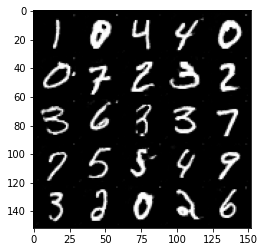

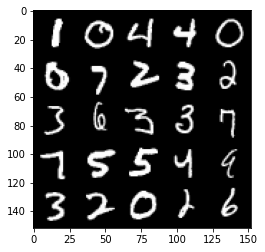

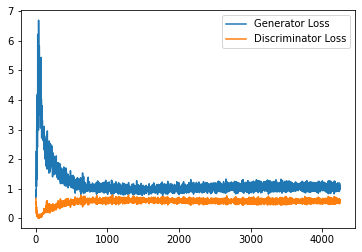

Step 85500: Generator loss: 1.0603005268573762, discriminator loss: 0.5826308284401893


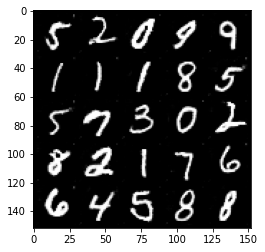

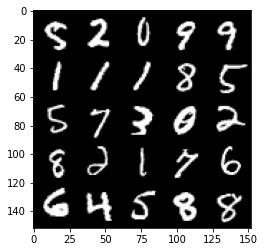

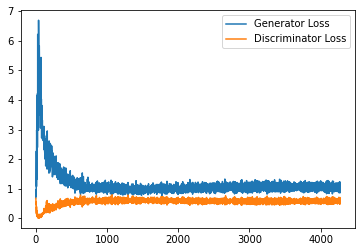

Step 86000: Generator loss: 1.075178754210472, discriminator loss: 0.5808738068342209


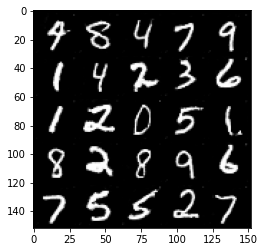

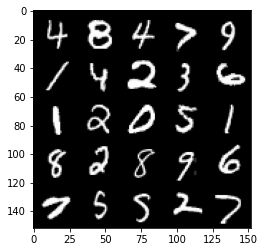

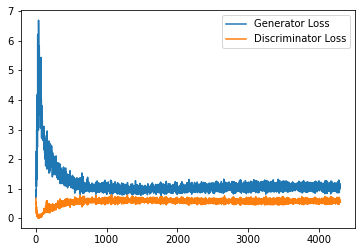

Step 86500: Generator loss: 1.055313829064369, discriminator loss: 0.5794156051278114


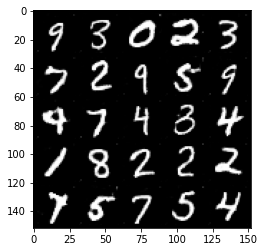

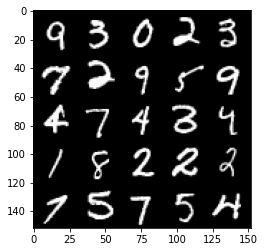

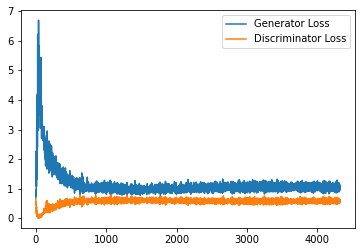

Step 87000: Generator loss: 1.0733229377269744, discriminator loss: 0.5775159948468208


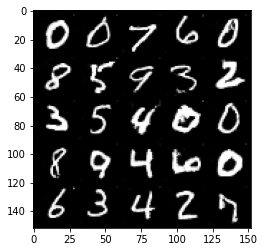

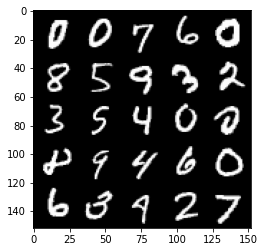

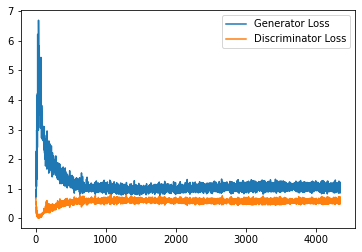

Step 87500: Generator loss: 1.052102760195732, discriminator loss: 0.5801333069205284


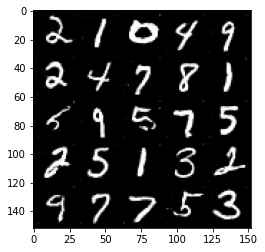

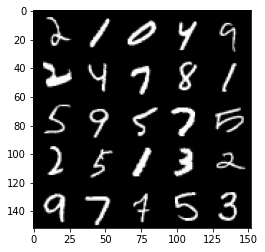

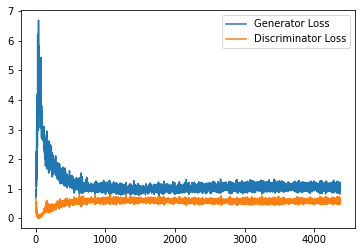

Step 88000: Generator loss: 1.032564614892006, discriminator loss: 0.5904712292551995


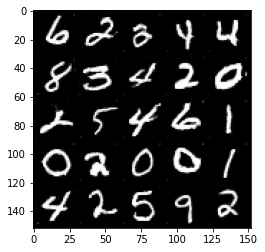

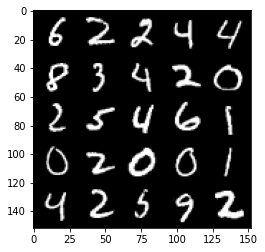

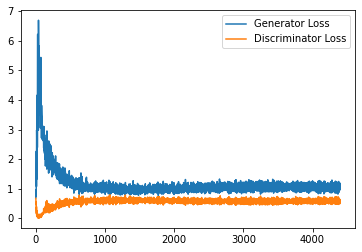

Step 88500: Generator loss: 1.0382149189710617, discriminator loss: 0.5866911714076996


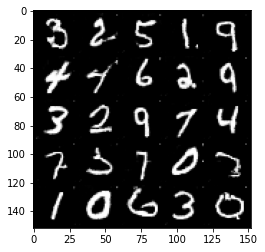

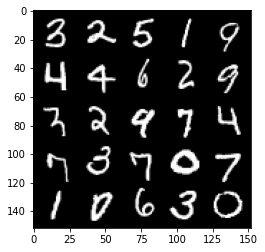

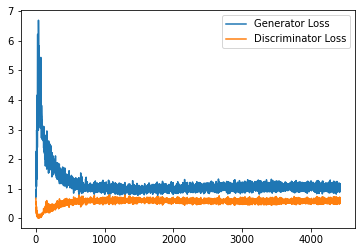

Step 89000: Generator loss: 1.0535579680204392, discriminator loss: 0.5811529278159141


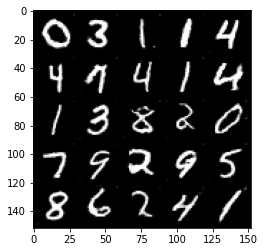

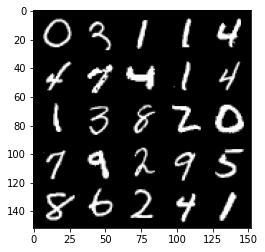

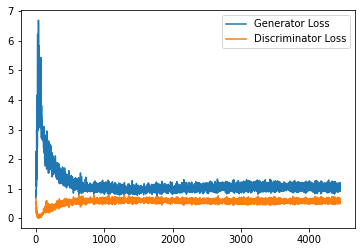

Step 89500: Generator loss: 1.0544245090484619, discriminator loss: 0.58383909958601


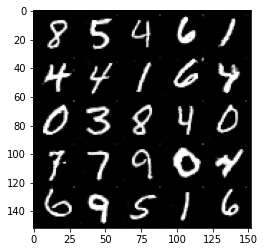

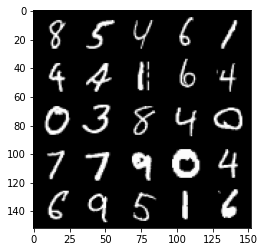

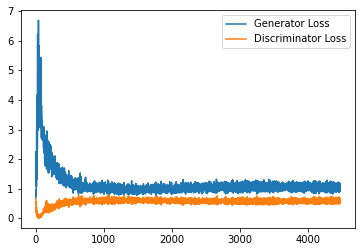

Step 90000: Generator loss: 1.0513148286342622, discriminator loss: 0.5867803388834


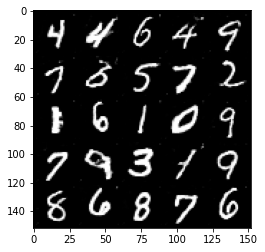

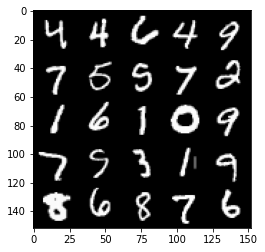

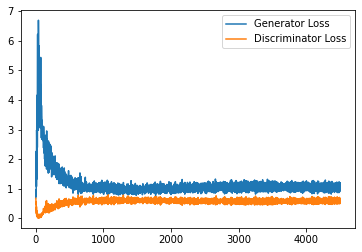

Step 90500: Generator loss: 1.0527614934444427, discriminator loss: 0.5819397718906403


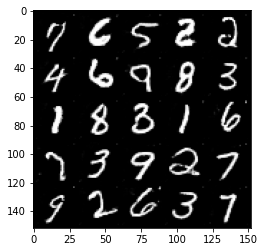

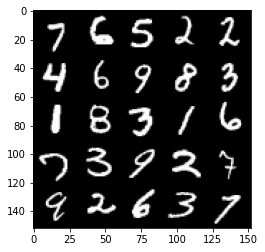

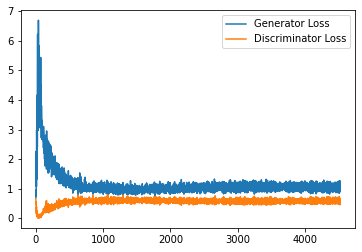

Step 91000: Generator loss: 1.0478557897806167, discriminator loss: 0.5814337238073349


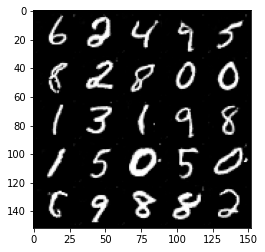

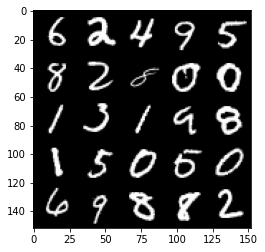

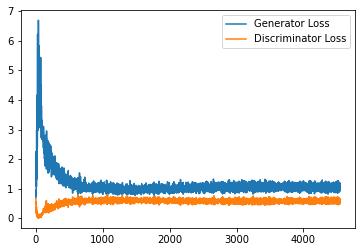

Step 91500: Generator loss: 1.0607871916294098, discriminator loss: 0.5829058952331543


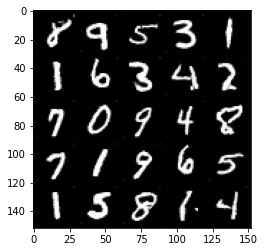

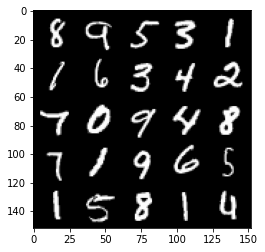

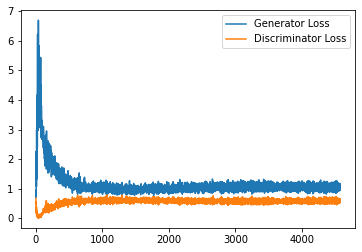

Step 92000: Generator loss: 1.06898000395298, discriminator loss: 0.5770888538360596


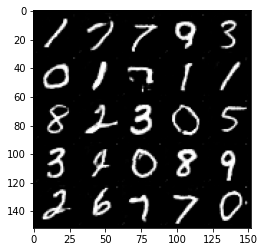

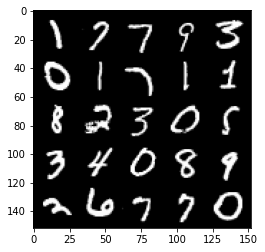

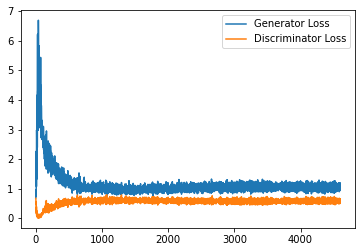

Step 92500: Generator loss: 1.0629219669103622, discriminator loss: 0.57928180372715


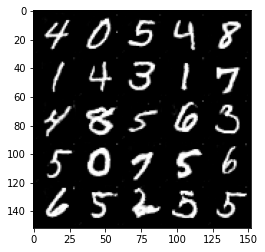

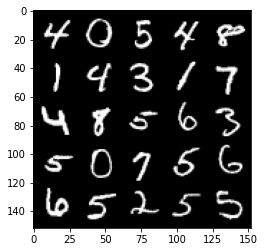

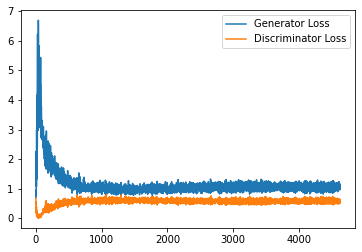

Step 93000: Generator loss: 1.0605417999029159, discriminator loss: 0.5821185782551765


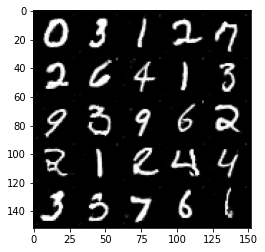

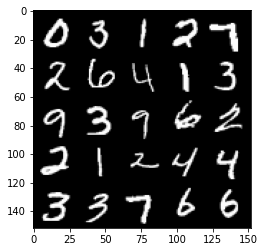

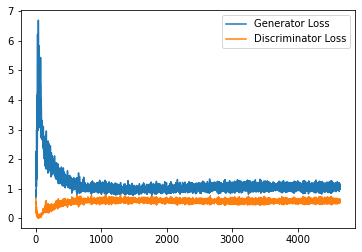

Step 93500: Generator loss: 1.0596137679815292, discriminator loss: 0.5844555302262306


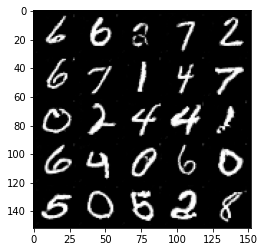

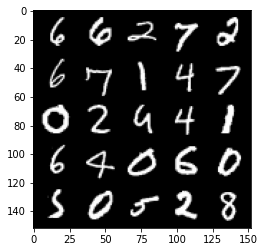

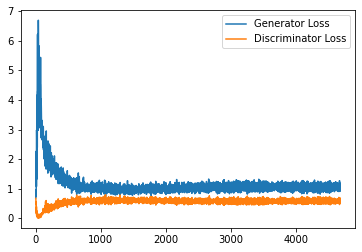

In [13]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED CELL
cur_step = 0
generator_losses = []
discriminator_losses = []

#UNIT TEST NOTE: Initializations needed for grading
noise_and_labels = False
fake = False

fake_image_and_labels = False
real_image_and_labels = False
disc_fake_pred = False
disc_real_pred = False

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size 
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        
        # Now you can get the images from the generator
        # Steps: 1) Combine the noise vectors and the one-hot labels for the generator
        #        2) Generate the conditioned fake images
       
        #### START CODE HERE ####
        noise_and_labels = combine_vectors(fake_noise, one_hot_labels)
        fake = gen(noise_and_labels)
        #### END CODE HERE ####
        
        # Make sure that enough images were generated
        assert len(fake) == len(real)
        # Check that correct tensors were combined
        assert tuple(noise_and_labels.shape) == (cur_batch_size, fake_noise.shape[1] + one_hot_labels.shape[1])
        # It comes from the correct generator
        assert tuple(fake.shape) == (len(real), 1, 28, 28)

        # Now you can get the predictions from the discriminator
        # Steps: 1) Create the input for the discriminator
        #           a) Combine the fake images with image_one_hot_labels, 
        #              remember to detach the generator (.detach()) so you do not backpropagate through it
        #           b) Combine the real images with image_one_hot_labels
        #        2) Get the discriminator's prediction on the fakes as disc_fake_pred
        #        3) Get the discriminator's prediction on the reals as disc_real_pred
        
        #### START CODE HERE ####
        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        real_image_and_labels = combine_vectors(real, image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels.detach())
        disc_real_pred = disc(real_image_and_labels)
        #### END CODE HERE ####
        
        # Make sure shapes are correct 
        assert tuple(fake_image_and_labels.shape) == (len(real), fake.detach().shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        assert tuple(real_image_and_labels.shape) == (len(real), real.shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        # Make sure that enough predictions were made
        assert len(disc_real_pred) == len(real)
        # Make sure that the inputs are different
        assert torch.any(fake_image_and_labels != real_image_and_labels)
        # Shapes must match
        assert tuple(fake_image_and_labels.shape) == tuple(real_image_and_labels.shape)
        assert tuple(disc_fake_pred.shape) == tuple(disc_real_pred.shape)
        
        
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step() 

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        elif cur_step == 0:
            print("Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!")
        cur_step += 1

## Exploration
You can do a bit of exploration now!

In [17]:
# Before you explore, you should put the generator
# in eval mode, both in general and so that batch norm
# doesn't cause you issues and is using its eval statistics
gen = gen.eval()

#### Changing the Class Vector
You can generate some numbers with your new model! You can add interpolation as well to make it more interesting.

So starting from a image, you will produce intermediate images that look more and more like the ending image until you get to the final image. Your're basically morphing one image into another. You can choose what these two images will be using your conditional GAN.

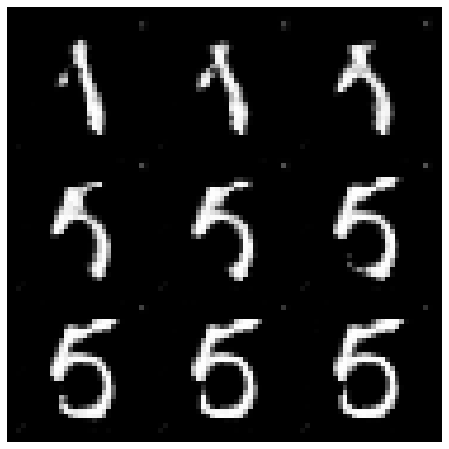

In [18]:
import math

### Change me! ###
n_interpolation = 9 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)
interpolation_noise = get_noise(1, z_dim, device=device).repeat(n_interpolation, 1)

def interpolate_class(first_number, second_number):
    first_label = get_one_hot_labels(torch.Tensor([first_number]).long(), n_classes)
    second_label = get_one_hot_labels(torch.Tensor([second_number]).long(), n_classes)

    # Calculate the interpolation vector between the two labels
    percent_second_label = torch.linspace(0, 1, n_interpolation)[:, None]
    interpolation_labels = first_label * (1 - percent_second_label) + second_label * percent_second_label

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

### Change me! ###
start_plot_number = 1 # Choose the start digit
### Change me! ###
end_plot_number = 5 # Choose the end digit

plt.figure(figsize=(8, 8))
interpolate_class(start_plot_number, end_plot_number)
_ = plt.axis('off')

### Uncomment the following lines of code if you would like to visualize a set of pairwise class 
### interpolations for a collection of different numbers, all in a single grid of interpolations.
### You'll also see another visualization like this in the next code block!
# plot_numbers = [2, 3, 4, 5, 7]
# n_numbers = len(plot_numbers)
# plt.figure(figsize=(8, 8))
# for i, first_plot_number in enumerate(plot_numbers):
#     for j, second_plot_number in enumerate(plot_numbers):
#         plt.subplot(n_numbers, n_numbers, i * n_numbers + j + 1)
#         interpolate_class(first_plot_number, second_plot_number)
#         plt.axis('off')
# plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
# plt.show()
# plt.close()

#### Changing the Noise Vector
Now, what happens if you hold the class constant, but instead you change the noise vector? You can also interpolate the noise vector and generate an image at each step.

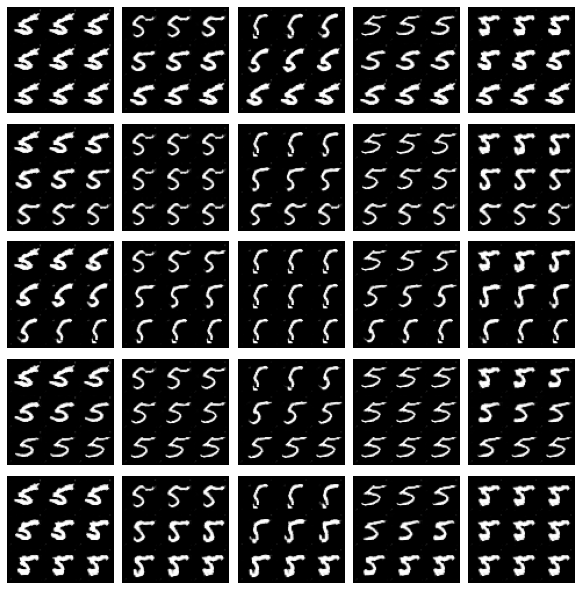

In [19]:
n_interpolation = 9 # How many intermediate images you want + 2 (for the start and end image)

# This time you're interpolating between the noise instead of the labels
interpolation_label = get_one_hot_labels(torch.Tensor([5]).long(), n_classes).repeat(n_interpolation, 1).float()

def interpolate_noise(first_noise, second_noise):
    # This time you're interpolating between the noise instead of the labels
    percent_first_noise = torch.linspace(0, 1, n_interpolation)[:, None].to(device)
    interpolation_noise = first_noise * percent_first_noise + second_noise * (1 - percent_first_noise)

    # Combine the noise and the labels again
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_label.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

# Generate noise vectors to interpolate between
### Change me! ###
n_noise = 5 # Choose the number of noise examples in the grid
plot_noises = [get_noise(1, z_dim, device=device) for i in range(n_noise)]
plt.figure(figsize=(8, 8))
for i, first_plot_noise in enumerate(plot_noises):
    for j, second_plot_noise in enumerate(plot_noises):
        plt.subplot(n_noise, n_noise, i * n_noise + j + 1)
        interpolate_noise(first_plot_noise, second_plot_noise)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()